数据集信息

1、帖文：
url链接、内容、发布时间、账号id、昵称、点赞数、评论数、转发数、帖文类型(07原贴,08评论，09转发)、原贴唯一标识（page_action_type）、贴文唯一标识

2、用户：
用户账号id、昵称、主页url、粉丝数、关注数、是否认证、微博账号类型(SNS_LEVEL)、个人认证(USER_GRADE)、简介、地域、认证说明


## 帖文内容词频统计与情感分析
**帖文词频统计(中英)**

    -->使用结巴/NLTK/Spacy基于词性分词，统计词频，做‘面’上的展示
    -->对大趋势是离群点， 做‘点’上的展示

**帖文情感分析(中英)**

    -->内容情感随时间的演化，pos/neg均分和数量的变化（中&英，微博&推特），观察坡峰坡谷时间点。
    -->基于帖文，随时间维度的情感倾向变化
    -->展示命名实体的情感倾向


In [1]:
# update ---09/11/2021
# 1.中文帖文，结巴分词步骤和停用次移除步骤顺序调整，输出完整词组的词云图像
# 2.中文帖文，使用cnsenti和SnowNLP做中文情感分类
# 3.根据情感分类，提取个性化pos/neu/neg的情感字典

In [2]:
# 改进方向 ---20/11/2021
# 1.从数据分析，对中文帖文进行NER展示
# 2.从结论分析：比较正负文本词典更细化情感分类、探究正负文本内的情绪变化

### 获取帖文文本

In [3]:
import os
import json
from tqdm import tqdm


# make file record all titles
titles_file = '/Users/patricia/Downloads/WnT-20210929/cnt/帖文/cnt.txt'

f_titles = open(titles_file, 'w', encoding='utf8')
count = 0 # count title numbers

# list all json files
operate_path = r"/Users/patricia/Downloads/WnT-20210929/cnt/帖文"
for root, dirs, files in os.walk(operate_path, topdown=False):
    for name in tqdm(files):
        # current json file path
        json_file = os.path.join(root, name)
        # extract title form json file
        with open(json_file, 'r', encoding='utf8') as load_f:
            try:
                load_dict = json.load(load_f)
                for i in load_dict:
                    title = i["content"]
                    title = title.strip() + '\n'
                    f_titles.write(title)
                count += 1 # count titles number
            except:
                pass


# close file
f_titles.close()
print(count) 

100%|██████████| 227/227 [00:00<00:00, 542.52it/s]

218


In [4]:
contents = []
with open(titles_file, 'r') as f:
    n=0
    for line in f:
        #print(line)
        contents.extend(line)
        n+=1
    print(n)
#contents

22262


In [5]:
sents = []
with open(titles_file, 'r') as f:
    for line in f:
        #print(line)
        sents.append(line)
sents

["Economista dice que El Salvador 'en camino a la muerte', sueldos pagados en e-CNY … - https://t.co/AnYdO4jK0Q\n",
 "Shanghai Man: Economist says El Salvador 'on road to death', salaries paid in e-CNY ... https://t.co/YUHryvJSp5#btc #eth #doge #bnb #crypto #xrp #ada #dot #bch #ltc #uni #crypto #cryptocurrency #cryptonews10%discount on #Binance :https://t.co/X88WOkuryx https://t.co/P8oG7vFlH1\n",
 'The feature comes months after a small-scale test in Beijing and is yet another sign China is widening its e-CNY tests towards a full launch.The post Chine...Read more: https://t.co/8pEV3fSya7\n',
 'Economista dice que El Salvador &amp;#039;en camino a la muerte&amp;#039;, sueldos pagados en e-CNY … Our Man in Shanghai se ha negado a permitir que las regulaciones recientes ralenticen las noticias provenientes de China. La cadena de bloques\xa0...  https://t.co/AnYdO4jK0Q\n',
 "Shanghai Man: Economist says El Salvador 'on road to death', salaries paid in e-CNY ... https://t.co/DJmvJB5A10 http

**过滤中文文本txt**

In [6]:
import langid                                                         #引入langid模块翻译语言
 
def translate_zh(inputFile, outputFile):
    fin = open(inputFile, 'r')                                    #以读的方式打开输入文件
    fout = open(outputFile, 'w')                                  #以写的方式打开输出文件
 
    for eachLine in fin:                                          #依次读入每一行
        line = str(eachLine.strip()) #去除每行的首位空格等，并统一转化成Unicode
        lineTuple = langid.classify(line)                     #调用langid来对该行进行语言检测
        if lineTuple[0] == "zh":                              #如果该行语言大部分为中文，则不进行任何处理
            fout.write(str(line.strip()) + '\n')     #输出非中文的行，从Unicode转化成utf-8输出
    fin.close()
    fout.close()
 
translate_zh(titles_file, "/Users/patricia/Downloads/WnT-20210929/cnt/帖文/Chi.txt")

**过滤英文文本txt**

In [7]:
def translate_en(inputFile, outputFile):
    fin = open(inputFile, 'r')                                    #以读的方式打开输入文件
    fout = open(outputFile, 'w')                                  #以写的方式打开输出文件
 
    for eachLine in fin:                                          #依次读入每一行
        line = str(eachLine.strip()) #去除每行的首位空格等，并统一转化成Unicode
        lineTuple = langid.classify(line)                     #调用langid来对该行进行语言检测
        if lineTuple[0] == "en":                              #如果该行语言大部分为中文，则不进行任何处理
            fout.write(str(line.strip()) + '\n')     #输出非中文的行，从Unicode转化成utf-8输出
    fin.close()
    fout.close()
 
translate_en(titles_file, "/Users/patricia/Downloads/WnT-20210929/cnt/帖文/Eng.txt")

### 中文帖文词频统计

In [8]:
import pandas as pd
data_chi = []
with open("/Users/patricia/Downloads/WnT-20210929/cnt/帖文/Chi.txt", 'r') as f:
    for line in f:
        data_chi.append(line.strip())
data_chi=pd.DataFrame(data_chi,columns=["Chinese"])

data_chi[:5]

,Chinese
0,@offweightstudio 有人把火币，比特币，数字人民币都分不清楚、就已经来教育别人了
1,@wangzhian8848 封杀比特币是不是给数字人民币腾地方？
2,@dougjing @dw_chinese 不算，数字人民币本质上也是人民币，和现金是兑换的...
3,@HenryLa13947038 数字人民币是现实中的人民币的数字化，和比特币这种基于虚拟计...
4,@ThECRackERBaRoN 昨天刚听了微博上卡相他们的一个关于虚拟货币的连线直播，还是...


In [9]:
data_chi[-15:]

,Chinese
15844,【超20家上市公司披露数字人民币业务 硬件产品与场景建设成两大方向】从上市公司半年报来看，多...
15845,区块链快讯 | 09月06日 星期一 1、紫光国微首推数字人民币解决方案，已在多个城市试点运...
15846,数字人民币如何使用？记者带你服贸会抢先体验！ 数字人民币如何使用？记者带你服贸会抢先体验！
15847,服贸会“奇”遇记：数字人民币人气旺 多应用场景亮相 服贸会“奇”遇记：数字人民币人气旺 多...
15848,#聚焦2021服贸会#【感受酷炫金融科技 体验有温度的服务】数字人民币火出圈、人工智能当客服...
15849,图片评论 ¡评论配图
15850,云象区块链推出全生命周期NFT行业技术解决方案*
15851,[赞]
15852,图片评论 ¡评论配图
15853,图片评论 ¡评论配图


In [10]:
import re
import string
import emoji

def clean_text(text):
    '''Make text lowercase, 
    remove text in square brackets,
    remove links,
    remove punctuation.'''
    text = str(text)
    text = re.sub('\(.*?\)', '', text)
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('\【.*?\】', '', text)
    text = re.sub('\《.*?\》', '', text)
    text = re.sub(r"#",'', text)
    text = re.sub(r"（",'', text)
    text = re.sub(r"）",'', text)
    text = re.sub(r"『",'', text)
    text = re.sub(r"』",'', text)
    text = re.sub(r"“",'', text)
    text = re.sub(r"”",'', text)
    text = re.sub(r"图片评论",'', text)
    text = re.sub(r"¡评论配图",'', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('\'','', text)
    #text = re.sub(r'\W+', '', text)
    #text = re.sub('[^%&,;=?$\x22]', '', text)
    text = re.sub("[a-zA-Z0-9]", "", text)
    text = re.sub(r'\b\w{1,2}\b', "", text) # removes remaining one-letter words and two letters words 
    text = re.sub(r"[ \t]{2,}", "", text)
    return text 


emoji_pattern = re.compile(
    u'[\uD800-\uDBFF][\uDC00-\uDFFF]'
    u"(\ud83d[\ude00-\ude4f])|"  # emoticons
    u"(\ud83c[\udf00-\uffff])|"  # symbols & pictographs (1 of 2)
    u"(\ud83d[\u0000-\uddff])|"  # symbols & pictographs (2 of 2)
    u"(\ud83d[\ude80-\udeff])|"  # transport & map symbols
    u"(\ud83c[\udde0-\uddff])"  # flags (iOS)
    "]+", flags=re.UNICODE)

def remove_emoji(text):
    return emoji_pattern.sub(r'', text)

def demojized(text):
    text = emoji.demojize(text)
    return text

data_chi["Chinese"] = data_chi["Chinese"].apply(lambda x : demojized(x))
data_chi["Chinese"] = data_chi["Chinese"].apply(lambda x : remove_emoji(x))
data_chi["Chinese"] = data_chi["Chinese"].apply(lambda x : clean_text(x))
data_chi["Chinese"]

0                           有人把火币，比特币，数字人民币都分不清楚、就已经来教育别人了
1                                       封杀比特币是不是给数字人民币腾地方？
2        ，数字人民币本质上也是人民币，和现金是兑换的关系，，只不过载体分别是金属代码而已。人民币的价...
3                数字人民币是现实中的人民币的数字化，和比特币这种基于虚拟计算生产的东西有本质区别的
4         昨天刚听了微博上卡相他们的一个关于虚拟货币的连线直播，还是挺有收获的。数字人民币和比特币完...
                               ...                        
15854                              支付宝上线爱心捐赠平台，捐赠者可获得数字画作 
15855                           紫光国微首推数字人民币解决方案，已在多个城市试点运行
15856                                                    ，
15857                                                     
15858                                               辛老师早上好
Name: Chinese, Length: 15859, dtype: object

In [11]:
data_chi=data_chi[data_chi["Chinese"] !='图片评论 ¡评论配图'] 
data_chi['len'] = data_chi['Chinese'].apply(lambda x:len(x))
data_chi=data_chi[data_chi['len']>1]

In [12]:
text=data_chi.copy()

In [13]:
#文本切割
import jieba
import jieba.posseg 
import codecs

def sent2word(line):
    segList = jieba.posseg.cut(line)
    segSentence = ''
    for word,flag in segList:
        if (word != '\t') and (word != ' ') and (len(word)>=2) and (flag[:1] in ['v','n']):
        #if (word != '\t') and (word != ' ') and (len(word)>=2) and (flag[:1] in ['n']):
            
            segSentence += word + " "
    return segSentence.strip()

target = codecs.open('/Users/patricia/Downloads/WnT-20210929/cnt/帖文/cut_aspect.txt', 'w', encoding='utf-8')
wordlist=[]
for i in data_chi["Chinese"]:
    seg_line = sent2word(i)
    target.writelines(seg_line + '\n')
    wordlist.append(seg_line)
    
wordlist[:5]

Building prefix dict from the default dictionary ...
Dumping model to file cache /var/folders/0s/r_ncjf_j67z8qchrjzz_8j640000gn/T/jieba.cache
Loading model cost 0.869 seconds.
Prefix dict has been built successfully.


['火币 比特 数字 人民币 教育',
 '封杀 比特 数字 人民币 地方',
 '数字 人民币 本质 人民币 现金 兑换 关系 载体 金属 代码 人民币 价值 取决于 中国政府 金融 信用 虚拟 货币 没有 价值 背书 价值 取决于 相信 价值 传销',
 '数字 人民币 现实 人民币 数字化 比特 虚拟 计算 生产 东西 本质区别',
 '上卡 虚拟 货币 连线 直播 收获 数字 人民币 比特 比特 背书 虚拟 商品 数字 政府 信用 背书 主权 货币 数字化 形式 数字化 数字 人民币 终归是 回到 发行 机构 关联 机构 银行']

In [14]:
# 加载常用停用词
stopwords1 = [line.rstrip() for line in open('/Users/patricia/Downloads/stopwords/中文停用词库.txt', 'r', encoding='utf-8')]
stopwords2 = [line.rstrip() for line in open('/Users/patricia/Downloads/stopwords/哈工大停用词表.txt', 'r', encoding='utf-8')]
stopwords3 = [line.rstrip() for line in open('/Users/patricia/Downloads/stopwords/四川大学机器智能实验室停用词库.txt', 'r', encoding='utf-8')]
stopwords4 = [line.rstrip() for line in open('/Users/patricia/Downloads/stopwords/stopwords.txt', 'r', encoding='utf-8')]
stopwords = stopwords1 + stopwords2 + stopwords3 + stopwords4

import codecs
filterlist=[]
def remove_stopwords(text):
    text = [i for i in text.split(' ') if (i not in stopwords)]
    seg_line=' '.join(text).strip()
    return seg_line

target = codecs.open('/Users/patricia/Downloads/WnT-20210929/cnt/帖文/filter.txt', 'w', encoding='utf-8')
for i in wordlist:
    seg_line = remove_stopwords(i)
    target.writelines(seg_line+'\n')
    filterlist.append(seg_line)

filterlist[:5]

['火币 比特 数字 人民币 教育',
 '封杀 比特 数字 人民币 地方',
 '数字 人民币 本质 人民币 现金 兑换 关系 载体 金属 代码 人民币 价值 取决于 中国政府 金融 信用 虚拟 货币 价值 背书 价值 取决于 价值 传销',
 '数字 人民币 现实 人民币 数字化 比特 虚拟 计算 生产 东西 本质区别',
 '上卡 虚拟 货币 连线 直播 收获 数字 人民币 比特 比特 背书 虚拟 商品 数字 政府 信用 背书 主权 货币 数字化 形式 数字化 数字 人民币 终归是 回到 发行 机构 关联 机构 银行']

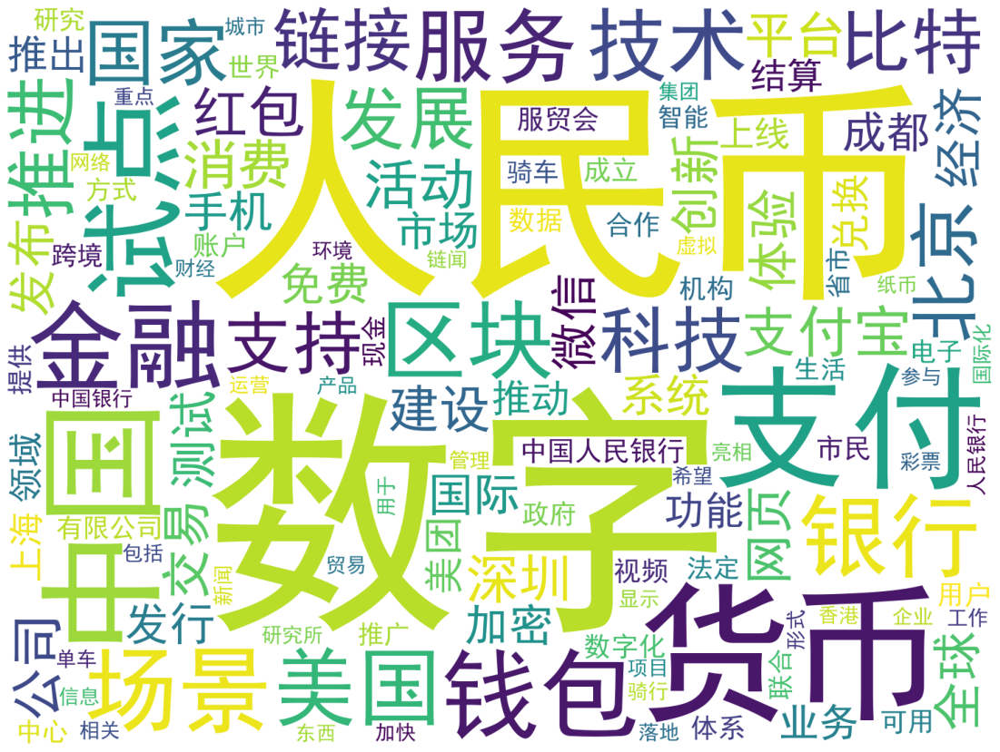

In [15]:
from wordcloud import WordCloud
import imageio #imageio.imread() scipy已经将imread等命令删除,我们需要换其他的库使用,imageio
import matplotlib.pyplot as plt
from collections import Counter
from collections import defaultdict

my_wordcloud = WordCloud(  
    background_color='white',  #设置背景颜色
    max_words=125,  #设置最大实现的字数
    font_path=r'/Users/patricia/Downloads/SimHei.ttf',  #设置字体格式，如不设置显示不了中文
    width=1440,
    height=1080,
    stopwords = stopwords
).generate_from_frequencies(Counter(" ".join(filterlist).split(" ")))
plt.figure(figsize=(20,15))
plt.imshow(my_wordcloud)
plt.axis('off')
plt.show()  # 展示词云
#my_wordcloud.to_file('result_aspect.jpg')
#my_wordcloud.to_file('result.jpg')

In [16]:
def top20(textlist):
    # First make a string out of the entire list
    BIGstr = " ".join(textlist)
    wordlist = BIGstr.split(" ")
    wordcount = Counter(wordlist) 
    del wordcount['']
    return(wordcount.most_common(20))

print(top20(filterlist))
temp = pd.DataFrame(top20(filterlist))
temp.columns = ['Cleaned_words','Count']
temp.style.background_gradient(cmap='Blues')

[('数字', 18844), ('人民币', 15910), ('货币', 4014), ('支付', 3244), ('中国', 2809), ('试点', 1770), ('钱包', 1548), ('金融', 1541), ('场景', 1360), ('银行', 1287), ('区块', 1197), ('美国', 1135), ('服务', 1067), ('技术', 1026), ('国家', 839), ('科技', 837), ('推进', 824), ('北京', 817), ('比特', 786), ('支持', 776)]


,Cleaned_words,Count
0,数字,18844
1,人民币,15910
2,货币,4014
3,支付,3244
4,中国,2809
5,试点,1770
6,钱包,1548
7,金融,1541
8,场景,1360
9,银行,1287


## 中文帖文情感分析

### 使用**snownlp**分类中文情感
**SnowNLP(text)**
        
    sentiments 情感:[0,1], 接近0表示负面情绪, 接近1表示正面情绪


### 使用**cnsenti**分类中文情绪

    cnsenti包括Emotion和Sentiment两大类
**Sentiment**

    sentiment_count(text) 
    统计正负情感词语数，默认使用Hownet词典
    
    words 文本中词语数; sentences 文本中句子数; pos 文本中正面词总个数; neg 文本中负面词总个数
   
    sentiment_calculate(text) 
    更精准的情感信息计算，额外考虑到情感词前是否有强度副词的修饰作用，以及是否有否定词的情感语义反转作用


**Emotion**

    emotion_count(text) 统计情绪词
    统计文本中各种情绪形容词出现的词语数，基于大连理工大学情感本体库词典，分类情绪包括(好、乐、哀、怒、惧、恶、惊)


In [17]:
print(len(text))
text

15432


,Chinese,len
0,有人把火币，比特币，数字人民币都分不清楚、就已经来教育别人了,31
1,封杀比特币是不是给数字人民币腾地方？,19
2,，数字人民币本质上也是人民币，和现金是兑换的关系，，只不过载体分别是金属代码而已。人民币的价...,105
3,数字人民币是现实中的人民币的数字化，和比特币这种基于虚拟计算生产的东西有本质区别的,42
4,昨天刚听了微博上卡相他们的一个关于虚拟货币的连线直播，还是挺有收获的。数字人民币和比特币完...,131
...,...,...
15848,、人工智能当客服、普惠小微贷款能自助……当科技牵手金融，能够碰撞出怎样的火花？一起感受金融领...,82
15850,云象区块链推出全生命周期行业技术解决方案,20
15854,支付宝上线爱心捐赠平台，捐赠者可获得数字画作,23
15855,紫光国微首推数字人民币解决方案，已在多个城市试点运行,26


#### 使用snownlp分类中文情感

In [18]:
from snownlp import SnowNLP
#计算情感分数
def compute_snownlp_scores(df, label):
    df["snownlp_scores"] = df[label].apply(lambda x: SnowNLP(x).sentiments)
    return df
sentiment = compute_snownlp_scores(text, "Chinese")
sentiment.head()

,Chinese,len,snownlp_scores
0,有人把火币，比特币，数字人民币都分不清楚、就已经来教育别人了,31,0.840050
1,封杀比特币是不是给数字人民币腾地方？,19,0.246328
2,，数字人民币本质上也是人民币，和现金是兑换的关系，，只不过载体分别是金属代码而已。人民币的价...,105,0.999998
3,数字人民币是现实中的人民币的数字化，和比特币这种基于虚拟计算生产的东西有本质区别的,42,0.996361
4,昨天刚听了微博上卡相他们的一个关于虚拟货币的连线直播，还是挺有收获的。数字人民币和比特币完...,131,0.999937


In [19]:
#根据阈值划分正负情感
def compute_snownlp_senti(df,refer):
    df["snownlp_senti"] = df[refer].apply(lambda x: "pos" if x>0.8 else ('neg' if x<0.5 else 'neu'))
    return df
sentiment = compute_snownlp_senti(sentiment, "snownlp_scores")
sentiment.head()

,Chinese,len,snownlp_scores,snownlp_senti
0,有人把火币，比特币，数字人民币都分不清楚、就已经来教育别人了,31,0.840050,pos
1,封杀比特币是不是给数字人民币腾地方？,19,0.246328,neg
2,，数字人民币本质上也是人民币，和现金是兑换的关系，，只不过载体分别是金属代码而已。人民币的价...,105,0.999998,pos
3,数字人民币是现实中的人民币的数字化，和比特币这种基于虚拟计算生产的东西有本质区别的,42,0.996361,pos
4,昨天刚听了微博上卡相他们的一个关于虚拟货币的连线直播，还是挺有收获的。数字人民币和比特币完...,131,0.999937,pos


In [20]:
from cnsenti import Sentiment,Emotion
def compute_cnsenti_scores(df, label):
    senti = Sentiment()
    emo = Emotion()
    df["cnsenti_neg"] = df[label].apply(lambda x: senti.sentiment_calculate(x)["neg"])
    df["cnsenti_pos"] = df[label].apply(lambda x: senti.sentiment_calculate(x)["pos"])
    df["cnsenti_sentiment_words"] = df[label].apply(lambda x: senti.sentiment_calculate(x)["words"])
    df["cnsenti_好"] = df[label].apply(lambda x: emo.emotion_count(x)["好"]) 
    df["cnsenti_乐"] = df[label].apply(lambda x: emo.emotion_count(x)["乐"]) 
    df["cnsenti_哀"] = df[label].apply(lambda x: emo.emotion_count(x)["哀"]) 
    df["cnsenti_怒"] = df[label].apply(lambda x: emo.emotion_count(x)["怒"]) 
    df["cnsenti_惧"] = df[label].apply(lambda x: emo.emotion_count(x)["惧"]) 
    df["cnsenti_恶"] = df[label].apply(lambda x: emo.emotion_count(x)["恶"]) 
    df["cnsenti_惊"] = df[label].apply(lambda x: emo.emotion_count(x)["惊"]) 
    df["cnsenti_emotion_words"] = df[label].apply(lambda x: emo.emotion_count(x)["words"])
    return df
cnsenti = compute_cnsenti_scores(text, "Chinese")
cnsenti.head()

,Chinese,len,snownlp_scores,snownlp_senti,cnsenti_neg,cnsenti_pos,cnsenti_sentiment_words,cnsenti_好,cnsenti_乐,cnsenti_哀,cnsenti_怒,cnsenti_惧,cnsenti_恶,cnsenti_惊,cnsenti_emotion_words
0,有人把火币，比特币，数字人民币都分不清楚、就已经来教育别人了,31,0.840050,pos,0.0,19.0,19,1,0,0,0,0,0,0,19
1,封杀比特币是不是给数字人民币腾地方？,19,0.246328,neg,0.0,10.0,11,0,0,0,0,0,0,0,11
2,，数字人民币本质上也是人民币，和现金是兑换的关系，，只不过载体分别是金属代码而已。人民币的价...,105,0.999998,pos,21.0,36.0,62,3,0,0,0,0,0,0,62
3,数字人民币是现实中的人民币的数字化，和比特币这种基于虚拟计算生产的东西有本质区别的,42,0.996361,pos,24.0,30.0,24,0,0,0,0,0,0,0,24
4,昨天刚听了微博上卡相他们的一个关于虚拟货币的连线直播，还是挺有收获的。数字人民币和比特币完...,131,0.999937,pos,0.0,51.0,78,2,0,0,0,0,0,0,78


In [21]:
cnsenti[cnsenti["cnsenti_好"]!=0].shape

(6868, 15)

In [22]:
cnsenti[cnsenti["cnsenti_乐"]!=0].shape

(3130, 15)

In [23]:
cnsenti[cnsenti["cnsenti_哀"]!=0].shape

(1248, 15)

In [24]:
cnsenti[cnsenti["cnsenti_怒"]!=0].shape

(77, 15)

In [25]:
cnsenti[cnsenti["cnsenti_惧"]!=0].shape

(836, 15)

In [26]:
cnsenti[cnsenti["cnsenti_恶"]!=0].shape

(3703, 15)

In [27]:
cnsenti[cnsenti["snownlp_senti"]=="pos"].shape

(8955, 15)

In [28]:
cnsenti[cnsenti["snownlp_senti"]=="neg"].shape

(3968, 15)

In [29]:
sentiment[sentiment["cnsenti_好"]!=0]["Chinese"]

0                           有人把火币，比特币，数字人民币都分不清楚、就已经来教育别人了
2        ，数字人民币本质上也是人民币，和现金是兑换的关系，，只不过载体分别是金属代码而已。人民币的价...
4         昨天刚听了微博上卡相他们的一个关于虚拟货币的连线直播，还是挺有收获的。数字人民币和比特币完...
8        比特币基金会主席 布罗克·皮尔斯：我认为中共国对数字货币的打压以推行数字人民币的这一举措让美...
9        央行前行长周小川：支付系统现代化是隔一段时间迈一个台阶要有比较大的台阶，大家才有足够的动力去...
                               ...                        
15834    交通出行服务 ，就数字人民币在高速公路等重点业务领域深度合作达成共识。 交通发布 服贸会上看...
15839    专属微博财商学院现在我们平时本来用现金就很少，支付宝微信支付不香么？何必多此一举？数字人民币...
15844    从上市公司半年报来看，多家公司正抢抓数字人民币业务，将数字人民币看作是下一个业务增长点。据记...
15845    区块链快讯星期一 、紫光国微首推数字人民币解决方案，已在多个城市试点运行 、支付宝上线爱心捐...
15854                              支付宝上线爱心捐赠平台，捐赠者可获得数字画作 
Name: Chinese, Length: 6868, dtype: object

In [30]:
percent_pos = round(100*sentiment[sentiment['snownlp_senti']=="pos"].shape[0]/sentiment['snownlp_senti'].shape[0], 2)
percent_neu = round(100*sentiment[sentiment['snownlp_senti']=="neu"].shape[0]/sentiment['snownlp_senti'].shape[0], 2)
percent_neg = round(100*sentiment[sentiment['snownlp_senti']=="neg"].shape[0]/sentiment['snownlp_senti'].shape[0], 2)

print(str(percent_pos) + "% 的帖文被SnowNLP分类为正面情感")
print(str(percent_neg) + "% 的帖文被SnowNLP分类为负面情感")

58.03% 的帖文被SnowNLP分类为正面情感
25.71% 的帖文被SnowNLP分类为负面情感


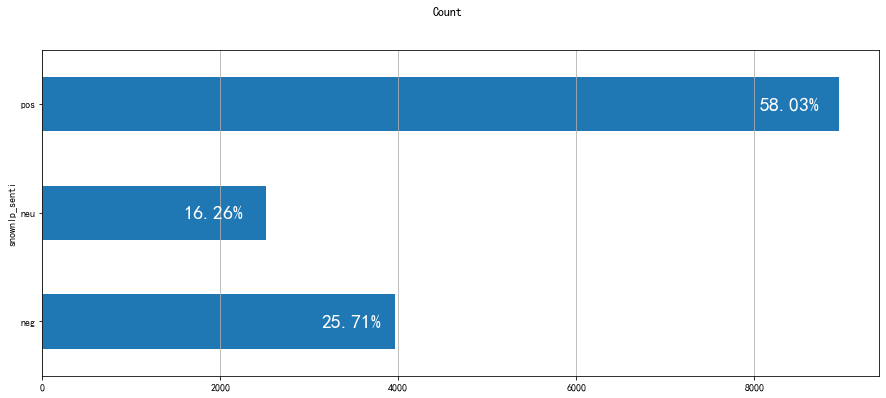

In [31]:
fig, ax = plt.subplots()
fig.set_size_inches(15, 6)
fig.suptitle("Count", fontsize=12)
sentiment.groupby("snownlp_senti").count()[["Chinese"]].rename(columns={"Chinese": "Count"}).plot(kind="barh", legend=False, 
        ax=ax).grid(axis='x')
plt.text(sentiment["snownlp_senti"].value_counts()[0]*(1-0.1), 1.95, str(percent_pos)+"%", fontdict={"fontsize": 20, "color": "white"})
plt.text(sentiment["snownlp_senti"].value_counts()[1]*(1-0.6), 0.95, str(percent_neu)+"%", fontdict={"fontsize": 20, "color": "white"})
plt.text(sentiment["snownlp_senti"].value_counts()[2]*(1+0.25), -0.05, str(percent_neg)+"%", fontdict={"fontsize": 20, "color": "white"})

plt.show()

In [32]:
target_pos = codecs.open('/Users/patricia/Downloads/WnT-20210929/cnt/帖文/pos_weibo_cut.txt', 'w', encoding='utf-8')
wordlist_pos=[]
for i in sentiment[sentiment["snownlp_senti"]=="pos"]["Chinese"]:
    seg_line = sent2word(i)
    target_pos.writelines(seg_line + '\n')
    wordlist_pos.append(seg_line)
    
wordlist_pos[:5]

['火币 比特 数字 人民币 教育',
 '数字 人民币 本质 人民币 现金 兑换 关系 载体 金属 代码 人民币 价值 取决于 中国政府 金融 信用 虚拟 货币 没有 价值 背书 价值 取决于 相信 价值 传销',
 '数字 人民币 现实 人民币 数字化 比特 虚拟 计算 生产 东西 本质区别',
 '上卡 虚拟 货币 连线 直播 收获 数字 人民币 比特 比特 背书 虚拟 商品 数字 政府 信用 背书 主权 货币 数字化 形式 数字化 数字 人民币 终归是 回到 发行 机构 关联 机构 银行',
 '金融 打响 东西 不能 占便宜 国家 承认 发行 骗人 成本 要币 发行 国家 数字 人民币 出来 需要 市场监管 加密 市场 看做 解读 发行 草泥马 代币']

In [33]:
target_neg = codecs.open('/Users/patricia/Downloads/WnT-20210929/cnt/帖文/neg_weibo_cut.txt', 'w', encoding='utf-8')
wordlist_neg=[]
for i in sentiment[sentiment["snownlp_senti"]=="neg"]["Chinese"]:
    seg_line = sent2word(i)
    target_neg.writelines(seg_line + '\n')
    wordlist_neg.append(seg_line)
    
wordlist_neg[:5]

['封杀 比特 数字 人民币 地方',
 '美国 银行 放到 银行 倒闭 国人 银行 换成 数字 人民币 不换',
 '银行 业务 强推 数字 钱包 升级 数字 钱包 不能 数字 人民币 数字 人民币 数字 钱包 加强 控制 何用途 数字 钱包 交易 置于 政府 监控 锁定 作废 编号 人民币 使用 指定 人民币 用途 马甲 粮票',
 '行长 周小川 支付 系统 现代化 台阶 台阶 大家 足够 动力 台阶 手机 厂商 发表 版本 台阶 改进 系统 可能 动力 数字 人民币',
 '货币 还有 应用 深圳 区块 发票 在用 杭州 区块 法院 证据 存档 全国 推广 国家队 区块 服务网络 数字 人民币 大家 看看 觉得 帮京 出来']

In [34]:
positive_weibo_text = " ".join([text for text in wordlist_pos]).split(' ')
negative_weibo_text = " ".join([text for text in wordlist_neg]).split(' ')

In [35]:
positive_weibo_word=set([i for i in positive_weibo_text if i not in negative_weibo_text])
neutral_weibo_word=set([i for i in negative_weibo_text if i in positive_weibo_text])
negative_weibo_word=set([i for i in negative_weibo_text if i not in positive_weibo_text])
print("--------------------------------")
print("Number of words in positive weibo:",'\n',len(positive_weibo_text))
print("Number of positive words:",'\n',len(positive_weibo_word))
print("--------------------------------")
print("Number of neutral words:",'\n',len(neutral_weibo_word))
print("--------------------------------")
print("Number of words in negative weibo:",'\n',len(negative_weibo_text))
print("Number of negative words:",'\n',len(negative_weibo_word))
print("--------------------------------")

--------------------------------
Number of words in positive weibo: 
 184354
Number of positive words: 
 6314
--------------------------------
Number of neutral words: 
 2784
--------------------------------
Number of words in negative weibo: 
 45145
Number of negative words: 
 2144
--------------------------------


In [36]:
mapped_positive_weibo_text=[text for text in positive_weibo_text if text in positive_weibo_word]
mapped_negative_weibo_text=[text for text in negative_weibo_text if text in negative_weibo_word]
print("Number of mapped positive text:",len(mapped_positive_weibo_text))
print("Number of mapped negative text:",len(mapped_negative_weibo_text))

Number of mapped positive text: 34485
Number of mapped negative text: 5644


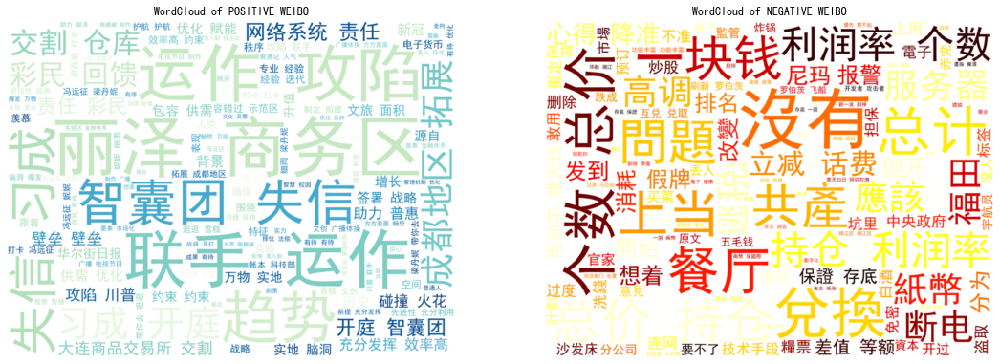

In [37]:
# 通过云图分别展示对应pos和neg的频繁出现单词
stopwords = stopwords1 + stopwords2 + stopwords3 + stopwords4

cloud_negative_weibo = " ".join(mapped_negative_weibo_text)
wordcloud_negative_weibo = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="hot",stopwords = stopwords).generate(cloud_negative_weibo)

cloud_positive_weibo = " ".join(mapped_positive_weibo_text)
wordcloud_positive_weibo = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf',colormap="GnBu_r",stopwords = stopwords).generate(cloud_positive_weibo)

parameters = {'axes.labelsize': 12,
              'axes.titlesize': 10}

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18.5, 7)
ax1.imshow(wordcloud_positive_weibo, interpolation='bilinear')
ax1.axis("off")
ax1.set_title("WordCloud of POSITIVE WEIBO", fontsize=12)
ax2.imshow(wordcloud_negative_weibo, interpolation='bilinear')
ax2.axis("off")
ax2.set_title("WordCloud of NEGATIVE WEIBO", fontsize=12)
plt.rcParams.update(parameters)
plt.show()

In [38]:
print(top20(mapped_positive_weibo_text))
temp_pos_weibo = pd.DataFrame(top20(mapped_positive_weibo_text))
temp_pos_weibo.columns = ['Positive_weibo_word','Count']
temp_pos_weibo.style.background_gradient(cmap='GnBu')

[('拓展', 142), ('智慧', 131), ('丽泽', 124), ('战略', 121), ('优化', 120), ('商务区', 106), ('助力', 106), ('成果', 104), ('普惠', 102), ('金融体系', 102), ('联手', 102), ('商圈', 94), ('文化', 94), ('运作', 82), ('攻陷', 80), ('联动', 78), ('台湾', 78), ('有待', 76), ('投资者', 74), ('万物', 70)]


,Positive_weibo_word,Count
0,拓展,142
1,智慧,131
2,丽泽,124
3,战略,121
4,优化,120
5,商务区,106
6,助力,106
7,成果,104
8,普惠,102
9,金融体系,102


In [39]:
print(top20(mapped_negative_weibo_text))
temp_neg_weibo = pd.DataFrame(top20(mapped_negative_weibo_text))
temp_neg_weibo.columns = ['Negative_weibo_word','Count']
temp_neg_weibo.style.background_gradient(cmap='OrRd')

[('沒有', 28), ('餐厅', 22), ('兌換', 20), ('手機', 20), ('利润率', 20), ('总计', 16), ('問題', 16), ('持仓', 16), ('个数', 16), ('总价', 16), ('保證', 14), ('等除', 14), ('上当', 13), ('糧票', 13), ('话费', 12), ('等额', 12), ('一块钱', 12), ('共產', 12), ('地下室', 12), ('钥匙扣', 12)]


,Negative_weibo_word,Count
0,沒有,28
1,餐厅,22
2,兌換,20
3,手機,20
4,利润率,20
5,总计,16
6,問題,16
7,持仓,16
8,个数,16
9,总价,16


### 以整体帖文情感分类中，更细粒度化的情感分类
#### 整体帖文分类为正面的词典
#### 以cnsenti分类词语情感和情绪

In [40]:
pos_dict=pd.DataFrame(mapped_positive_weibo_text,columns=["pos_dict"])
pos_dict = compute_snownlp_scores(pos_dict, "pos_dict")
pos_dict = compute_snownlp_senti(pos_dict, "snownlp_scores")
pos_dict = compute_cnsenti_scores(pos_dict, "pos_dict")

In [41]:
pos_words=pos_dict[pos_dict["cnsenti_pos"]>0]["pos_dict"]
neg_words=pos_dict[pos_dict["cnsenti_neg"]>0]["pos_dict"]

pos_words_dict=[]
for i in pos_words:
    pos_words_dict.append(i)
    
neg_words_dict=[]
for i in neg_words:
    neg_words_dict.append(i)

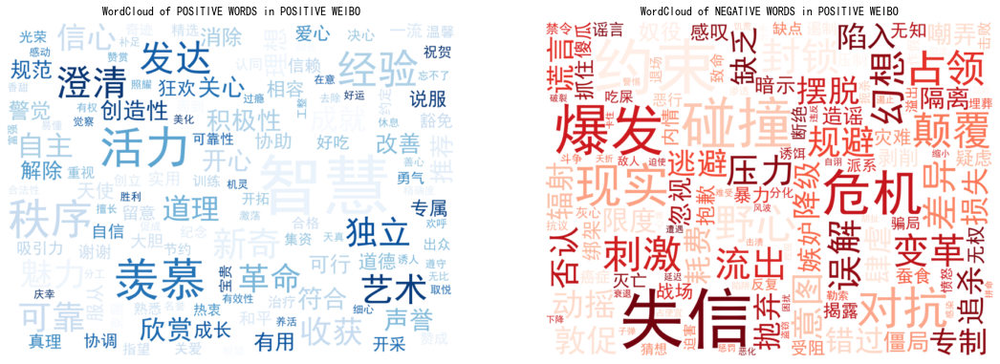

In [42]:
# 通过云图分别展示对应pos和neg的频繁出现单词
stopwords = stopwords1 + stopwords2 + stopwords3 + stopwords4

cloud_negative_weibo =  " ".join(neg_words_dict)
wordcloud_negative_weibo = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="Reds",stopwords = stopwords,collocations=False).generate(cloud_negative_weibo)

cloud_positive_weibo =  " ".join(pos_words_dict)
wordcloud_positive_weibo = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf',colormap="Blues",stopwords = stopwords,collocations=False).generate(cloud_positive_weibo)

parameters = {'axes.labelsize': 12,
              'axes.titlesize': 10}

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18.5, 7)
ax1.imshow(wordcloud_positive_weibo, interpolation='bilinear')
ax1.axis("off")
ax1.set_title("WordCloud of POSITIVE WORDS in POSITIVE WEIBO", fontsize=12)
ax2.imshow(wordcloud_negative_weibo, interpolation='bilinear')
ax2.axis("off")
ax2.set_title("WordCloud of NEGATIVE WORDS in POSITIVE WEIBO", fontsize=12)
plt.rcParams.update(parameters)
plt.show()

In [43]:
print(top20(pos_words_dict))
t = pd.DataFrame(top20(pos_words_dict))
t.columns = ['POSITIVE WORDS by cnsenti in POSITIVE WEIBO','Count']
t.style.background_gradient(cmap='Blues')

[('智慧', 131), ('羡慕', 49), ('活力', 48), ('秩序', 42), ('经验', 40), ('发达', 30), ('澄清', 29), ('可靠', 26), ('新奇', 26), ('艺术', 26), ('独立', 24), ('魅力', 24), ('收获', 22), ('革命', 22), ('有力', 20), ('信心', 20), ('自主', 18), ('道理', 18), ('成就', 18), ('欣赏', 16)]


,POSITIVE WORDS by cnsenti in POSITIVE WEIBO,Count
0,智慧,131
1,羡慕,49
2,活力,48
3,秩序,42
4,经验,40
5,发达,30
6,澄清,29
7,可靠,26
8,新奇,26
9,艺术,26


In [44]:
print(top20(neg_words_dict))
t = pd.DataFrame(top20(neg_words_dict))
t.columns = ['NEGATIVE WORDS by cnsenti in POSITIVE WEIBO','Count']
t.style.background_gradient(cmap='Reds')

[('失信', 66), ('约束', 58), ('碰撞', 46), ('爆发', 45), ('危机', 36), ('现实', 32), ('对抗', 30), ('野心', 24), ('颠覆', 22), ('封锁', 22), ('占领', 22), ('刺激', 22), ('幻想', 20), ('流出', 18), ('变革', 18), ('误解', 18), ('差异', 18), ('意图', 16), ('规避', 16), ('压力', 16)]


,NEGATIVE WORDS by cnsenti in POSITIVE WEIBO,Count
0,失信,66
1,约束,58
2,碰撞,46
3,爆发,45
4,危机,36
5,现实,32
6,对抗,30
7,野心,24
8,颠覆,22
9,封锁,22


In [45]:
happy=pos_dict[pos_dict["cnsenti_好"]>0]["pos_dict"]
happy_percent= round(100*happy.shape[0]/pos_dict.shape[0], 2)
print("在SnowNLP分类为正面情感的帖文中，"+"有"+str(happy_percent)+"% 的词语被cnsenti识别为'好'的情绪")

joy=pos_dict[pos_dict["cnsenti_乐"]>0]["pos_dict"]
joy_percent= round(100*joy.shape[0]/pos_dict.shape[0], 2)
print("在SnowNLP分类为正面情感的帖文中，"+"有"+str(joy_percent)+"% 的词语被cnsenti识别为'乐'的情绪")

sad=pos_dict[pos_dict["cnsenti_哀"]>0]["pos_dict"]
sad_percent= round(100*sad.shape[0]/pos_dict.shape[0], 2)
print("在SnowNLP分类为正面情感的帖文中，"+"有"+str(sad_percent)+"% 的词语被cnsenti识别为'哀'的情绪")

angry=pos_dict[pos_dict["cnsenti_怒"]>0]["pos_dict"]
angry_percent= round(100*angry.shape[0]/pos_dict.shape[0], 2)
print("在SnowNLP分类为正面情感的帖文中，"+"有"+str(sad_percent)+"% 的词语被cnsenti识别为'怒'的情绪")

scared=pos_dict[pos_dict["cnsenti_惧"]>0]["pos_dict"]
scared_percent= round(100*scared.shape[0]/pos_dict.shape[0], 2)
print("在SnowNLP分类为正面情感的帖文中，"+"有"+str(sad_percent)+"% 的词语被cnsenti识别为'惧'的情绪")

hate=pos_dict[pos_dict["cnsenti_恶"]>0]["pos_dict"]
hate_percent= round(100*hate.shape[0]/pos_dict.shape[0], 2)
print("在SnowNLP分类为正面情感的帖文中，"+"有"+str(hate_percent)+"% 的词语被cnsenti识别为'恶'的情绪")

suprise=pos_dict[pos_dict["cnsenti_惊"]>0]["pos_dict"]
suprise_percent= round(100*suprise.shape[0]/pos_dict.shape[0], 2)
print("在SnowNLP分类为正面情感的帖文中，"+"有"+str(suprise_percent)+"% 的词语被cnsenti识别为'惊'的情绪")

unknow_percent=round(100-happy_percent-joy_percent-sad_percent-angry_percent-scared_percent-hate_percent-suprise_percent,2)
print("在SnowNLP分类为正面情感的帖文中，"+"有"+str(unknow_percent)+"% 的词语未被cnsenti识别于所属情绪")


在SnowNLP分类为正面情感的帖文中，有5.23% 的词语被cnsenti识别为'好'的情绪
在SnowNLP分类为正面情感的帖文中，有1.57% 的词语被cnsenti识别为'乐'的情绪
在SnowNLP分类为正面情感的帖文中，有0.32% 的词语被cnsenti识别为'哀'的情绪
在SnowNLP分类为正面情感的帖文中，有0.32% 的词语被cnsenti识别为'怒'的情绪
在SnowNLP分类为正面情感的帖文中，有0.32% 的词语被cnsenti识别为'惧'的情绪
在SnowNLP分类为正面情感的帖文中，有3.17% 的词语被cnsenti识别为'恶'的情绪
在SnowNLP分类为正面情感的帖文中，有0.03% 的词语被cnsenti识别为'惊'的情绪
在SnowNLP分类为正面情感的帖文中，有89.31% 的词语未被cnsenti识别于所属情绪


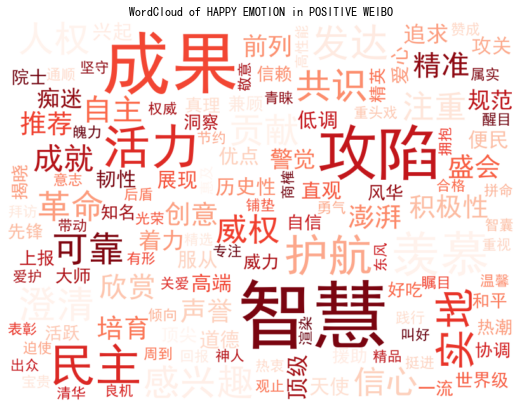

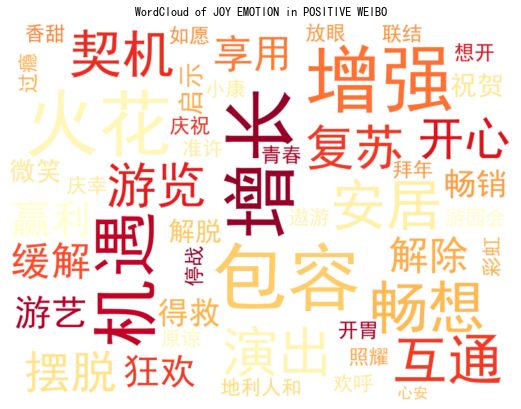

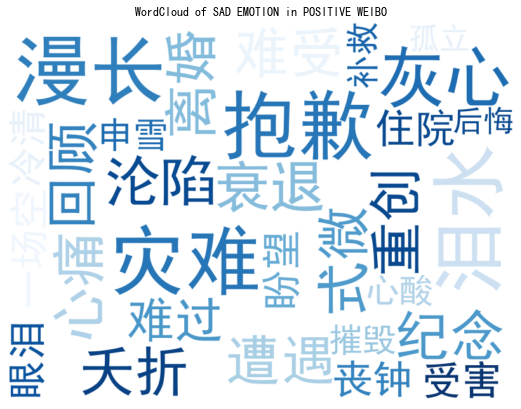

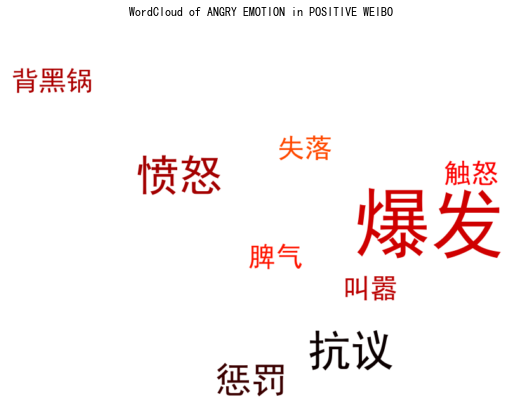

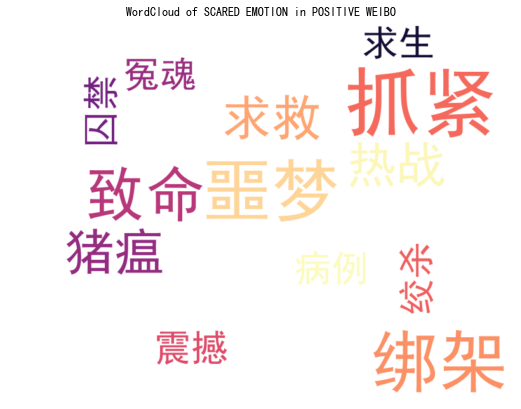

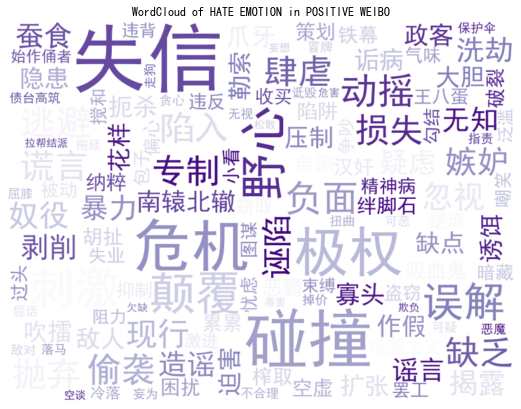

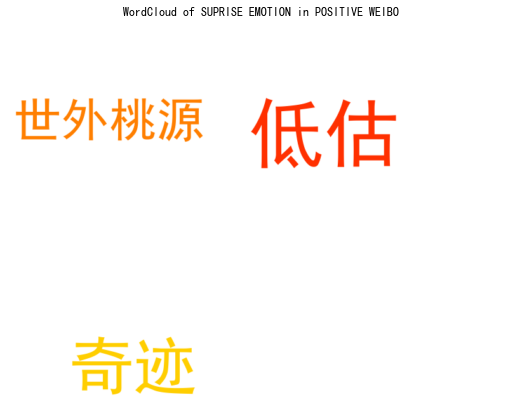

In [46]:
# 通过云图分别展示对应pos和neg的频繁出现单词
stopwords = stopwords1 + stopwords2 + stopwords3 + stopwords4

cloud_happy =  " ".join(happy)
wordcloud_happy = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="Reds",stopwords = stopwords,collocations=False).generate(cloud_happy)
cloud_joy=" ".join(joy)
wordcloud_joy = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="YlOrRd",stopwords = stopwords,collocations=False).generate(cloud_joy)
cloud_sad=" ".join(sad)
wordcloud_sad = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="Blues",stopwords = stopwords,collocations=False).generate(cloud_sad)
cloud_angry=" ".join(angry)
wordcloud_angry = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="hot",stopwords = stopwords,collocations=False).generate(cloud_angry)
cloud_scared=" ".join(scared)
wordcloud_scared = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="magma",stopwords = stopwords,collocations=False).generate(cloud_scared)
cloud_hate=" ".join(hate)
wordcloud_hate= WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="Purples",stopwords = stopwords,collocations=False).generate(cloud_hate)
cloud_suprise=" ".join(suprise)
wordcloud_suprise= WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="autumn",stopwords = stopwords,collocations=False).generate(cloud_suprise)





parameters = {'axes.labelsize': 12,
              'axes.titlesize': 10}
fig1,ax1=plt.subplots(figsize=(32,16))
fig1.set_size_inches(18.5, 7)
ax1.imshow(wordcloud_happy, interpolation='bilinear')
ax1.axis("off")
ax1.set_title("WordCloud of HAPPY EMOTION in POSITIVE WEIBO", fontsize=12)

fig2,ax2=plt.subplots(figsize=(32,16))
fig2.set_size_inches(18.5, 7)
ax2.imshow(wordcloud_joy, interpolation='bilinear')
ax2.axis("off")
ax2.set_title("WordCloud of JOY EMOTION in POSITIVE WEIBO", fontsize=12)

fig3,ax3=plt.subplots(figsize=(32,16))
fig3.set_size_inches(18.5, 7)
ax3.imshow(wordcloud_sad, interpolation='bilinear')
ax3.axis("off")
ax3.set_title("WordCloud of SAD EMOTION in POSITIVE WEIBO", fontsize=12)

fig4,ax4=plt.subplots(figsize=(32,16))
fig4.set_size_inches(18.5, 7)
ax4.imshow(wordcloud_angry, interpolation='bilinear')
ax4.axis("off")
ax4.set_title("WordCloud of ANGRY EMOTION in POSITIVE WEIBO", fontsize=12)

fig5,ax5=plt.subplots(figsize=(32,16))
fig5.set_size_inches(18.5, 7)
ax5.imshow(wordcloud_scared, interpolation='bilinear')
ax5.axis("off")
ax5.set_title("WordCloud of SCARED EMOTION in POSITIVE WEIBO", fontsize=12)

fig6,ax6=plt.subplots(figsize=(32,16))
fig6.set_size_inches(18.5, 7)
ax6.imshow(wordcloud_hate, interpolation='bilinear')
ax6.axis("off")
ax6.set_title("WordCloud of HATE EMOTION in POSITIVE WEIBO", fontsize=12)

fig7,ax7=plt.subplots(figsize=(32,16))
fig7.set_size_inches(18.5, 7)
ax7.imshow(wordcloud_suprise, interpolation='bilinear')
ax7.axis("off")
ax7.set_title("WordCloud of SUPRISE EMOTION in POSITIVE WEIBO", fontsize=12)

plt.rcParams.update(parameters)
plt.show()

#### 以SnowNLP分类词语情感

In [47]:
percent_pos = round(100*pos_dict[pos_dict['snownlp_senti']=="pos"].shape[0]/pos_dict['snownlp_senti'].shape[0], 2)
percent_neu = round(100*pos_dict[pos_dict['snownlp_senti']=="neu"].shape[0]/pos_dict['snownlp_senti'].shape[0], 2)
percent_neg = round(100*pos_dict[pos_dict['snownlp_senti']=="neg"].shape[0]/pos_dict['snownlp_senti'].shape[0], 2)

print("在以整体帖文情感分类为正面情感的字典中，"+str(percent_pos) + " % 的词语被cnsenti分类为正面词语")
print("在以整体帖文情感分类为正面情感的字典中，"+str(percent_neg) + "% 的词语被cnsenti分类为负面词语")

在以整体帖文情感分类为正面情感的字典中，21.08 % 的词语被cnsenti分类为正面词语
在以整体帖文情感分类为正面情感的字典中，20.01% 的词语被cnsenti分类为负面词语


In [48]:
pos_dict_pos_text=[]
for i in " ".join(pos_dict[pos_dict['snownlp_senti']=="pos"]["pos_dict"]).split():
    pos_dict_pos_text.append(i)

In [49]:
pos_dict_neg_text=[]
for i in " ".join(pos_dict[pos_dict['snownlp_senti']=="neg"]["pos_dict"]).split():
    pos_dict_neg_text.append(i)

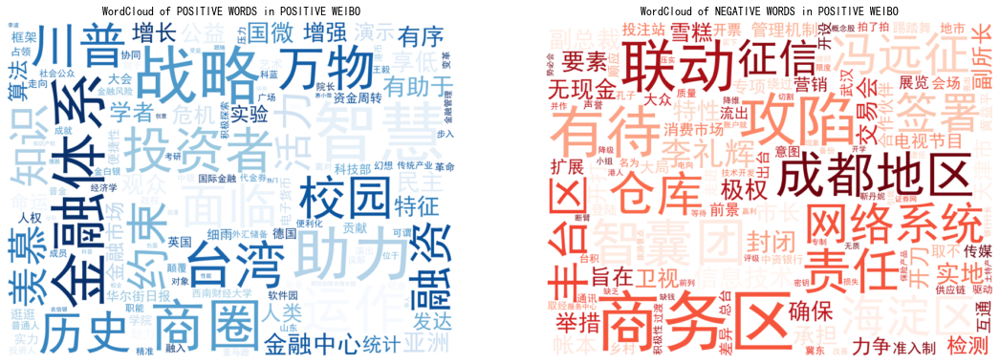

In [50]:
# 通过云图分别展示对应pos和neg的频繁出现单词
stopwords = stopwords1 + stopwords2 + stopwords3 + stopwords4

cloud_negative_weibo =  " ".join(pos_dict_neg_text)
wordcloud_negative_weibo = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="Reds",stopwords = stopwords,collocations=False).generate(cloud_negative_weibo)

cloud_positive_weibo =  " ".join(pos_dict_pos_text)
wordcloud_positive_weibo = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf',colormap="Blues",stopwords = stopwords,collocations=False).generate(cloud_positive_weibo)

parameters = {'axes.labelsize': 12,
              'axes.titlesize': 10}

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18.5, 7)
ax1.imshow(wordcloud_positive_weibo, interpolation='bilinear')
ax1.axis("off")
ax1.set_title("WordCloud of POSITIVE WORDS in POSITIVE WEIBO", fontsize=12)
ax2.imshow(wordcloud_negative_weibo, interpolation='bilinear')
ax2.axis("off")
ax2.set_title("WordCloud of NEGATIVE WORDS in POSITIVE WEIBO", fontsize=12)
plt.rcParams.update(parameters)
plt.show()

In [51]:
print(top20(pos_dict_pos_text))
t = pd.DataFrame(top20(pos_dict_pos_text))
t.columns = ['POSITIVE WORDS by SnowNLP in POSITIVE WEIBO','Count']
t.style.background_gradient(cmap='Blues')

[('智慧', 131), ('战略', 121), ('助力', 106), ('金融体系', 102), ('商圈', 94), ('运作', 82), ('台湾', 78), ('投资者', 74), ('万物', 70), ('面临', 68), ('川普', 66), ('校园', 65), ('历史', 60), ('约束', 58), ('融资', 58), ('知识', 50), ('羡慕', 49), ('活力', 48), ('金融中心', 48), ('有序', 46)]


,POSITIVE WORDS by SnowNLP in POSITIVE WEIBO,Count
0,智慧,131
1,战略,121
2,助力,106
3,金融体系,102
4,商圈,94
5,运作,82
6,台湾,78
7,投资者,74
8,万物,70
9,面临,68


In [52]:
print(top20(pos_dict_neg_text))
t = pd.DataFrame(top20(pos_dict_neg_text))
t.columns = ['NEGATIVE WORDS by SnowNLP in POSITIVE WEIBO','Count']
t.style.background_gradient(cmap='Reds')

[('商务区', 106), ('攻陷', 80), ('联动', 78), ('有待', 76), ('智囊团', 62), ('责任', 56), ('成都地区', 56), ('仓库', 52), ('冯远征', 48), ('海淀区', 46), ('网络系统', 46), ('签署', 43), ('丰台区', 42), ('征信', 38), ('李礼辉', 36), ('信息技术', 36), ('封闭', 36), ('实地', 34), ('极权', 32), ('副总裁', 32)]


,NEGATIVE WORDS by SnowNLP in POSITIVE WEIBO,Count
0,商务区,106
1,攻陷,80
2,联动,78
3,有待,76
4,智囊团,62
5,责任,56
6,成都地区,56
7,仓库,52
8,冯远征,48
9,海淀区,46


#### 整体帖文分类为负面的词典
#### 以cnsenti分类词语情感和情绪

In [53]:
neg_dict=pd.DataFrame(mapped_negative_weibo_text,columns=["neg_dict"])
neg_dict = compute_snownlp_scores(neg_dict, "neg_dict")
neg_dict = compute_snownlp_senti(neg_dict, "snownlp_scores")
neg_dict = compute_cnsenti_scores(neg_dict, "neg_dict")
neg_dict["snownlp_senti"].value_counts()

neu    2708
neg    2679
pos     257
Name: snownlp_senti, dtype: int64

In [54]:
pos_words=neg_dict[neg_dict["cnsenti_pos"]>0]["neg_dict"]
neg_words=neg_dict[neg_dict["cnsenti_neg"]>0]["neg_dict"]

pos_words_dict=[]
for i in pos_words:
    pos_words_dict.append(i)
    
neg_words_dict=[]
for i in neg_words:
    neg_words_dict.append(i)

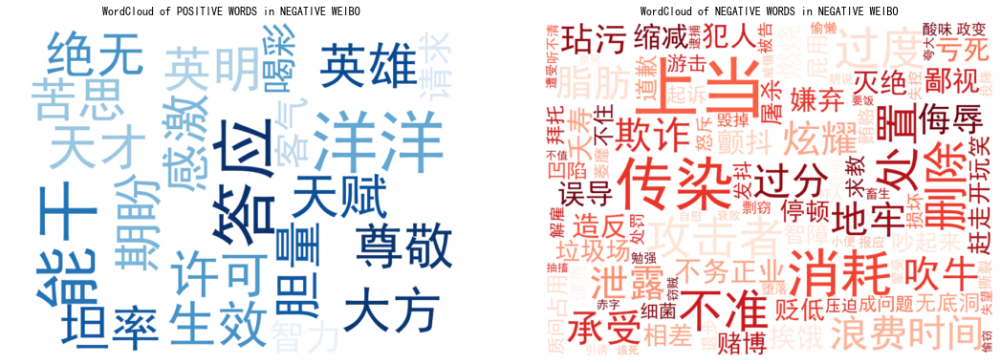

In [55]:
# 通过云图分别展示对应pos和neg的频繁出现单词
stopwords = stopwords1 + stopwords2 + stopwords3 + stopwords4

cloud_negative_weibo =  " ".join(neg_words_dict)
wordcloud_negative_weibo = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="Reds",stopwords = stopwords,collocations=False).generate(cloud_negative_weibo)

cloud_positive_weibo =  " ".join(pos_words_dict)
wordcloud_positive_weibo = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf',colormap="Blues",stopwords = stopwords,collocations=False).generate(cloud_positive_weibo)

parameters = {'axes.labelsize': 12,
              'axes.titlesize': 10}

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18.5, 7)
ax1.imshow(wordcloud_positive_weibo, interpolation='bilinear')
ax1.axis("off")
ax1.set_title("WordCloud of POSITIVE WORDS in NEGATIVE WEIBO", fontsize=12)
ax2.imshow(wordcloud_negative_weibo, interpolation='bilinear')
ax2.axis("off")
ax2.set_title("WordCloud of NEGATIVE WORDS in NEGATIVE WEIBO", fontsize=12)
plt.rcParams.update(parameters)
plt.show()

In [56]:
print(top20(pos_words_dict))
t = pd.DataFrame(top20(pos_words_dict))
t.columns = ['POSITIVE WORDS by cnsenti in NEGATIVE WEIBO','Count']
t.style.background_gradient(cmap='Blues')

[('洋洋', 4), ('能干', 4), ('答应', 4), ('坦率', 2), ('天才', 2), ('尊敬', 2), ('胆量', 2), ('许可', 2), ('英雄', 2), ('英明', 2), ('绝无', 2), ('期盼', 2), ('生效', 2), ('大方', 2), ('感激', 2), ('天赋', 2), ('苦思', 2), ('智力', 2), ('喝彩', 2), ('请求', 2)]


,POSITIVE WORDS by cnsenti in NEGATIVE WEIBO,Count
0,洋洋,4
1,能干,4
2,答应,4
3,坦率,2
4,天才,2
5,尊敬,2
6,胆量,2
7,许可,2
8,英雄,2
9,英明,2


In [57]:
print(top20(neg_words_dict))
t = pd.DataFrame(top20(neg_words_dict))
t.columns = ['NEGATIVE WORDS by cnsenti in NEGATIVE WEIBO','Count']
t.style.background_gradient(cmap='Reds')

[('上当', 13), ('传染', 10), ('消耗', 8), ('处置', 6), ('不准', 6), ('删除', 6), ('过度', 6), ('攻击者', 6), ('浪费时间', 4), ('炫耀', 4), ('过分', 4), ('泄露', 4), ('脂肪', 4), ('承受', 4), ('吹牛', 4), ('欺诈', 4), ('错误', 4), ('地牢', 4), ('玷污', 3), ('侮辱', 3)]


,NEGATIVE WORDS by cnsenti in NEGATIVE WEIBO,Count
0,上当,13
1,传染,10
2,消耗,8
3,处置,6
4,不准,6
5,删除,6
6,过度,6
7,攻击者,6
8,浪费时间,4
9,炫耀,4


In [58]:
happy=neg_dict[neg_dict["cnsenti_好"]>0]["neg_dict"]
happy_percent= round(100*happy.shape[0]/neg_dict.shape[0], 2)
print("在SnowNLP分类为负面情感的帖文中，"+"有"+str(happy_percent)+"% 的词语被cnsenti识别为'好'的情绪")

joy=neg_dict[neg_dict["cnsenti_乐"]>0]["neg_dict"]
joy_percent= round(100*joy.shape[0]/neg_dict.shape[0], 2)
print("在SnowNLP分类为负面情感的帖文中，"+"有"+str(joy_percent)+"% 的词语被cnsenti识别为'乐'的情绪")

sad=neg_dict[neg_dict["cnsenti_哀"]>0]["neg_dict"]
sad_percent= round(100*sad.shape[0]/neg_dict.shape[0], 2)
print("在SnowNLP分类为负面情感的帖文中，"+"有"+str(sad_percent)+"% 的词语被cnsenti识别为'哀'的情绪")

angry=neg_dict[neg_dict["cnsenti_怒"]>0]["neg_dict"]
angry_percent= round(100*angry.shape[0]/neg_dict.shape[0], 2)
print("在SnowNLP分类为负面情感的帖文中，"+"有"+str(sad_percent)+"% 的词语被cnsenti识别为'怒'的情绪")

scared=neg_dict[neg_dict["cnsenti_惧"]>0]["neg_dict"]
scared_percent= round(100*scared.shape[0]/neg_dict.shape[0], 2)
print("在SnowNLP分类为负面情感的帖文中，"+"有"+str(sad_percent)+"% 的词语被cnsenti识别为'惧'的情绪")

hate=neg_dict[neg_dict["cnsenti_恶"]>0]["neg_dict"]
hate_percent= round(100*hate.shape[0]/neg_dict.shape[0], 2)
print("在SnowNLP分类为负面情感的帖文中，"+"有"+str(hate_percent)+"% 的词语被cnsenti识别为'恶'的情绪")

suprise=neg_dict[neg_dict["cnsenti_惊"]>0]["neg_dict"]
suprise_percent= round(100*suprise.shape[0]/neg_dict.shape[0], 2)
print("在SnowNLP分类为负面情感的帖文中，"+"有"+str(suprise_percent)+"% 的词语被cnsenti识别为'惊'的情绪")

unknow_percent=round(100-happy_percent-joy_percent-sad_percent-angry_percent-scared_percent-hate_percent-suprise_percent,2)
print("在SnowNLP分类为负面情感的帖文中，"+"有"+str(unknow_percent)+"% 的词语未被cnsenti识别于所属情绪")


在SnowNLP分类为负面情感的帖文中，有2.21% 的词语被cnsenti识别为'好'的情绪
在SnowNLP分类为负面情感的帖文中，有0.27% 的词语被cnsenti识别为'乐'的情绪
在SnowNLP分类为负面情感的帖文中，有0.46% 的词语被cnsenti识别为'哀'的情绪
在SnowNLP分类为负面情感的帖文中，有0.46% 的词语被cnsenti识别为'怒'的情绪
在SnowNLP分类为负面情感的帖文中，有0.46% 的词语被cnsenti识别为'惧'的情绪
在SnowNLP分类为负面情感的帖文中，有3.37% 的词语被cnsenti识别为'恶'的情绪
在SnowNLP分类为负面情感的帖文中，有0.04% 的词语被cnsenti识别为'惊'的情绪
在SnowNLP分类为负面情感的帖文中，有93.27% 的词语未被cnsenti识别于所属情绪


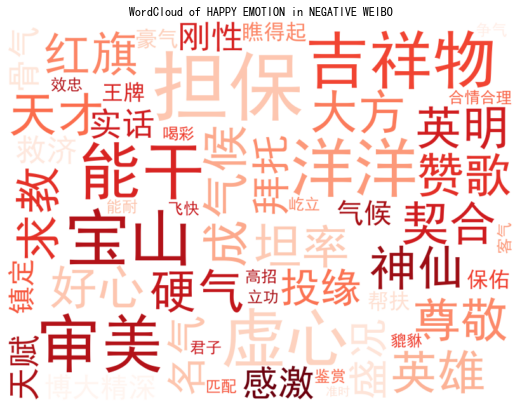

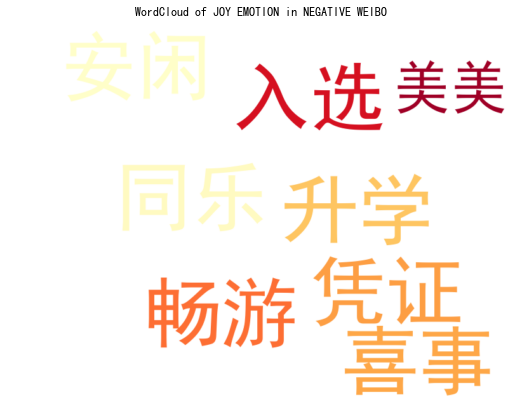

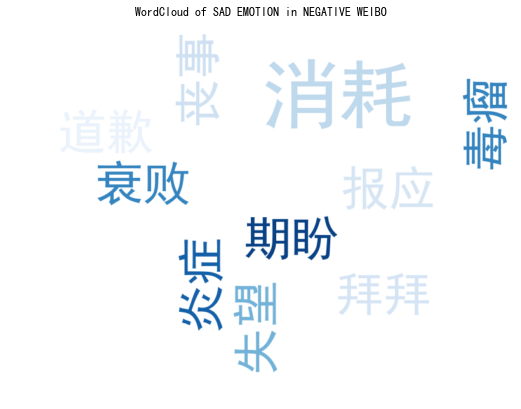

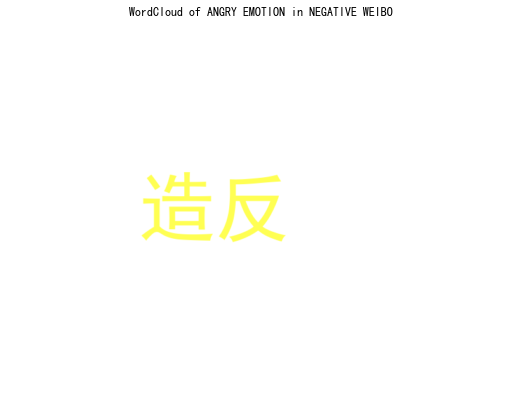

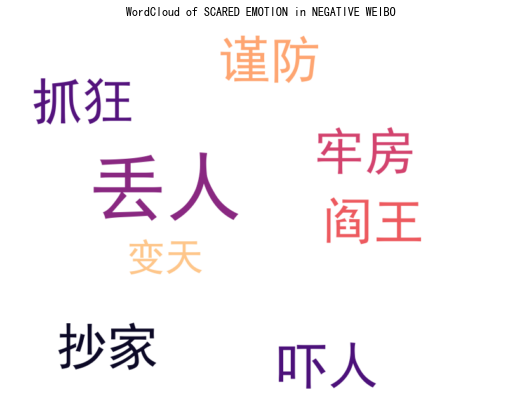

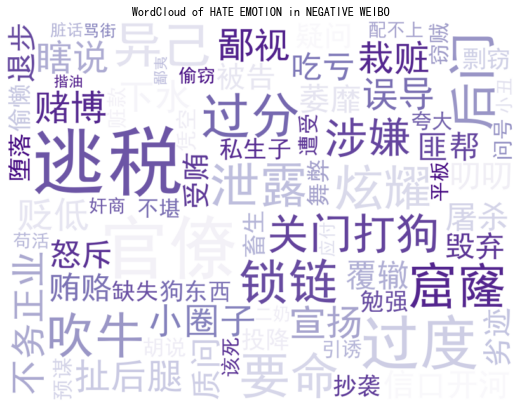

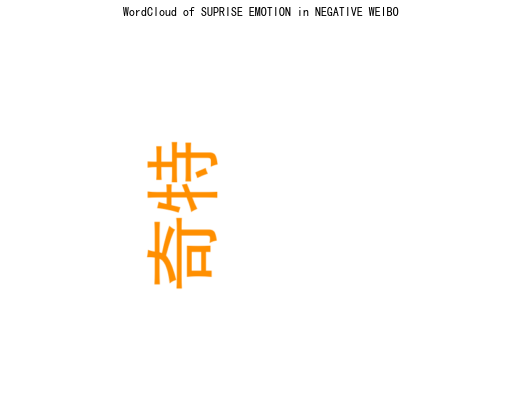

In [59]:
# 通过云图分别展示对应pos和neg的频繁出现单词
stopwords = stopwords1 + stopwords2 + stopwords3 + stopwords4

cloud_happy =  " ".join(happy)
wordcloud_happy = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="Reds",stopwords = stopwords,collocations=False).generate(cloud_happy)
cloud_joy=" ".join(joy)
wordcloud_joy = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="YlOrRd",stopwords = stopwords,collocations=False).generate(cloud_joy)
cloud_sad=" ".join(sad)
wordcloud_sad = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="Blues",stopwords = stopwords,collocations=False).generate(cloud_sad)
cloud_angry=" ".join(angry)
wordcloud_angry = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="hot",stopwords = stopwords,collocations=False).generate(cloud_angry)
cloud_scared=" ".join(scared)
wordcloud_scared = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="magma",stopwords = stopwords,collocations=False).generate(cloud_scared)
cloud_hate=" ".join(hate)
wordcloud_hate= WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="Purples",stopwords = stopwords,collocations=False).generate(cloud_hate)
cloud_suprise=" ".join(suprise)
wordcloud_suprise= WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="autumn",stopwords = stopwords,collocations=False).generate(cloud_suprise)





parameters = {'axes.labelsize': 12,
              'axes.titlesize': 10}
fig1,ax1=plt.subplots(figsize=(32,16))
fig1.set_size_inches(18.5, 7)
ax1.imshow(wordcloud_happy, interpolation='bilinear')
ax1.axis("off")
ax1.set_title("WordCloud of HAPPY EMOTION in NEGATIVE WEIBO", fontsize=12)

fig2,ax2=plt.subplots(figsize=(32,16))
fig2.set_size_inches(18.5, 7)
ax2.imshow(wordcloud_joy, interpolation='bilinear')
ax2.axis("off")
ax2.set_title("WordCloud of JOY EMOTION in NEGATIVE WEIBO", fontsize=12)

fig3,ax3=plt.subplots(figsize=(32,16))
fig3.set_size_inches(18.5, 7)
ax3.imshow(wordcloud_sad, interpolation='bilinear')
ax3.axis("off")
ax3.set_title("WordCloud of SAD EMOTION in NEGATIVE WEIBO", fontsize=12)

fig4,ax4=plt.subplots(figsize=(32,16))
fig4.set_size_inches(18.5, 7)
ax4.imshow(wordcloud_angry, interpolation='bilinear')
ax4.axis("off")
ax4.set_title("WordCloud of ANGRY EMOTION in NEGATIVE WEIBO", fontsize=12)

fig5,ax5=plt.subplots(figsize=(32,16))
fig5.set_size_inches(18.5, 7)
ax5.imshow(wordcloud_scared, interpolation='bilinear')
ax5.axis("off")
ax5.set_title("WordCloud of SCARED EMOTION in NEGATIVE WEIBO", fontsize=12)

fig6,ax6=plt.subplots(figsize=(32,16))
fig6.set_size_inches(18.5, 7)
ax6.imshow(wordcloud_hate, interpolation='bilinear')
ax6.axis("off")
ax6.set_title("WordCloud of HATE EMOTION in NEGATIVE WEIBO", fontsize=12)

fig7,ax7=plt.subplots(figsize=(32,16))
fig7.set_size_inches(18.5, 7)
ax7.imshow(wordcloud_suprise, interpolation='bilinear')
ax7.axis("off")
ax7.set_title("WordCloud of SUPRISE EMOTION in NEGATIVE WEIBO", fontsize=12)

plt.rcParams.update(parameters)
plt.show()

#### 以SnowNLP分类词情感正负

In [60]:
neg_dict_pos_text =[i for i in neg_dict[neg_dict['snownlp_senti']=="pos"]["neg_dict"]]
neg_dict_neg_text =[i for i in neg_dict[neg_dict['snownlp_senti']=="neg"]["neg_dict"]]
percent_pos = round(100*neg_dict[neg_dict['snownlp_senti']=="pos"].shape[0]/neg_dict['snownlp_senti'].shape[0], 2)
percent_neu = round(100*neg_dict[neg_dict['snownlp_senti']=="neu"].shape[0]/neg_dict['snownlp_senti'].shape[0], 2)
percent_neg = round(100*neg_dict[neg_dict['snownlp_senti']=="neg"].shape[0]/neg_dict['snownlp_senti'].shape[0], 2)

print("在以整体帖文情感分类为负面情感的字典中，"+str(percent_pos) + " % 的词语被SnowNLP分类为正面词语")
print("在以整体帖文情感分类为负面情感的字典中，"+str(percent_neg) + "% 的词语被SnowNLP分类为负面词语")

在以整体帖文情感分类为负面情感的字典中，4.55 % 的词语被SnowNLP分类为正面词语
在以整体帖文情感分类为负面情感的字典中，47.47% 的词语被SnowNLP分类为负面词语


In [61]:
pos_text=" ".join(neg_dict_pos_text).split(" ")
neg_text=" ".join(neg_dict_neg_text).split(" ")

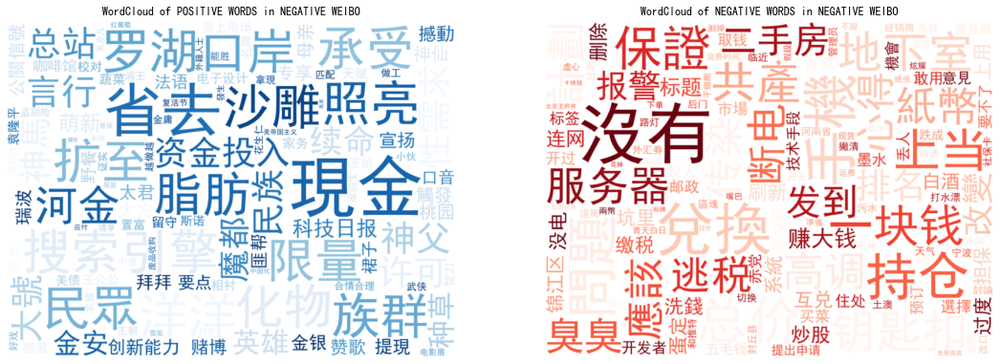

In [62]:
# 通过云图分别展示对应pos和neg的频繁出现单词
stopwords = stopwords1 + stopwords2 + stopwords3 + stopwords4

cloud_negative_weibo =  " ".join(neg_text)
wordcloud_negative_weibo = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="Reds_r",stopwords = stopwords,collocations=False).generate(cloud_negative_weibo)

cloud_positive_weibo =  " ".join(pos_text)
wordcloud_positive_weibo = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf',colormap="Blues_r",stopwords = stopwords,collocations=False).generate(cloud_positive_weibo)

parameters = {'axes.labelsize': 12,
              'axes.titlesize': 10}

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18.5, 7)
ax1.imshow(wordcloud_positive_weibo, interpolation='bilinear')
ax1.axis("off")
ax1.set_title("WordCloud of POSITIVE WORDS in NEGATIVE WEIBO", fontsize=12)
ax2.imshow(wordcloud_negative_weibo, interpolation='bilinear')
ax2.axis("off")
ax2.set_title("WordCloud of NEGATIVE WORDS in NEGATIVE WEIBO", fontsize=12)
plt.rcParams.update(parameters)
plt.show()

In [63]:
print(top20(neg_dict_pos_text))
t = pd.DataFrame(top20(neg_dict_pos_text))
t.columns = ['POSITIVE WORDS by SnowNLP in NEGATIVE WEIBO','Count']
t.style.background_gradient(cmap='Blues')

[('現金', 8), ('省去', 6), ('限量', 4), ('洋洋', 4), ('搜索引擎', 4), ('扩至', 4), ('照亮', 4), ('罗湖口岸', 4), ('族群', 4), ('脂肪', 4), ('承受', 4), ('民眾', 4), ('沙雕', 4), ('化物', 4), ('河金', 3), ('神父', 2), ('言行', 2), ('总站', 2), ('性需求', 2), ('许可', 2)]


,POSITIVE WORDS by SnowNLP in NEGATIVE WEIBO,Count
0,現金,8
1,省去,6
2,限量,4
3,洋洋,4
4,搜索引擎,4
5,扩至,4
6,照亮,4
7,罗湖口岸,4
8,族群,4
9,脂肪,4


In [64]:
print(top20(neg_dict_neg_text))
t = pd.DataFrame(top20(neg_dict_neg_text))
t.columns = ['NEGATIVE WORDS by SnowNLP in NEGATIVE WEIBO','Count']
t.style.background_gradient(cmap='Reds')

[('沒有', 28), ('兌換', 20), ('手機', 20), ('問題', 16), ('持仓', 16), ('总价', 16), ('保證', 14), ('上当', 13), ('一块钱', 12), ('共產', 12), ('地下室', 12), ('钥匙扣', 12), ('應該', 10), ('紙幣', 10), ('高调', 10), ('服务器', 10), ('断电', 10), ('传染', 10), ('計劃', 10), ('逃税', 10)]


,NEGATIVE WORDS by SnowNLP in NEGATIVE WEIBO,Count
0,沒有,28
1,兌換,20
2,手機,20
3,問題,16
4,持仓,16
5,总价,16
6,保證,14
7,上当,13
8,一块钱,12
9,共產,12


#### 正负帖文的整体情绪占比

In [65]:
sentiment = compute_snownlp_scores(text, "Chinese")
sentiment.head()

,Chinese,len,snownlp_scores,snownlp_senti,cnsenti_neg,cnsenti_pos,cnsenti_sentiment_words,cnsenti_好,cnsenti_乐,cnsenti_哀,cnsenti_怒,cnsenti_惧,cnsenti_恶,cnsenti_惊,cnsenti_emotion_words
0,有人把火币，比特币，数字人民币都分不清楚、就已经来教育别人了,31,0.840050,pos,0.0,19.0,19,1,0,0,0,0,0,0,19
1,封杀比特币是不是给数字人民币腾地方？,19,0.246328,neg,0.0,10.0,11,0,0,0,0,0,0,0,11
2,，数字人民币本质上也是人民币，和现金是兑换的关系，，只不过载体分别是金属代码而已。人民币的价...,105,0.999998,pos,21.0,36.0,62,3,0,0,0,0,0,0,62
3,数字人民币是现实中的人民币的数字化，和比特币这种基于虚拟计算生产的东西有本质区别的,42,0.996361,pos,24.0,30.0,24,0,0,0,0,0,0,0,24
4,昨天刚听了微博上卡相他们的一个关于虚拟货币的连线直播，还是挺有收获的。数字人民币和比特币完...,131,0.999937,pos,0.0,51.0,78,2,0,0,0,0,0,0,78


In [66]:
pos=sentiment[sentiment["snownlp_senti"]=='pos']
pos=pos[pos["cnsenti_好"]>0]
neg=sentiment[sentiment["snownlp_senti"]=='neg']

In [67]:
def emotion_division(text,senti,emo):
    text=text[text["snownlp_senti"]==senti]
    emo_div=text[text[emo]>1]
    percent= round(100*emo_div.shape[0]/text.shape[0], 2)
    print("在SnowNLP分类为"+"'"+senti+"'"+"情感的帖文中，"+"有"+str(percent)+"% 的帖文被cnsenti识别为含有"+"\""+emo[-1:]+"\""+"情绪的词语")
    #return emo_div
    
emotion_division(sentiment,'pos',"cnsenti_好")
emotion_division(sentiment,'pos',"cnsenti_乐")
emotion_division(sentiment,'pos',"cnsenti_哀")
emotion_division(sentiment,'pos',"cnsenti_怒")
emotion_division(sentiment,'pos',"cnsenti_惧")
emotion_division(sentiment,'pos',"cnsenti_恶")
emotion_division(sentiment,'pos',"cnsenti_惊")
print("-------------------------------------------------------------------------")
emotion_division(sentiment,'neg',"cnsenti_好")
emotion_division(sentiment,'neg',"cnsenti_乐")
emotion_division(sentiment,'neg',"cnsenti_哀")
emotion_division(sentiment,'neg',"cnsenti_怒")
emotion_division(sentiment,'neg',"cnsenti_惧")
emotion_division(sentiment,'neg',"cnsenti_恶")
emotion_division(sentiment,'neg',"cnsenti_惊")

在SnowNLP分类为'pos'情感的帖文中，有28.99% 的帖文被cnsenti识别为含有"好"情绪的词语
在SnowNLP分类为'pos'情感的帖文中，有7.64% 的帖文被cnsenti识别为含有"乐"情绪的词语
在SnowNLP分类为'pos'情感的帖文中，有0.76% 的帖文被cnsenti识别为含有"哀"情绪的词语
在SnowNLP分类为'pos'情感的帖文中，有0.18% 的帖文被cnsenti识别为含有"怒"情绪的词语
在SnowNLP分类为'pos'情感的帖文中，有0.93% 的帖文被cnsenti识别为含有"惧"情绪的词语
在SnowNLP分类为'pos'情感的帖文中，有8.73% 的帖文被cnsenti识别为含有"恶"情绪的词语
在SnowNLP分类为'pos'情感的帖文中，有0.04% 的帖文被cnsenti识别为含有"惊"情绪的词语
-------------------------------------------------------------------------
在SnowNLP分类为'neg'情感的帖文中，有11.47% 的帖文被cnsenti识别为含有"好"情绪的词语
在SnowNLP分类为'neg'情感的帖文中，有5.42% 的帖文被cnsenti识别为含有"乐"情绪的词语
在SnowNLP分类为'neg'情感的帖文中，有0.86% 的帖文被cnsenti识别为含有"哀"情绪的词语
在SnowNLP分类为'neg'情感的帖文中，有0.0% 的帖文被cnsenti识别为含有"怒"情绪的词语
在SnowNLP分类为'neg'情感的帖文中，有0.71% 的帖文被cnsenti识别为含有"惧"情绪的词语
在SnowNLP分类为'neg'情感的帖文中，有7.59% 的帖文被cnsenti识别为含有"恶"情绪的词语
在SnowNLP分类为'neg'情感的帖文中，有0.05% 的帖文被cnsenti识别为含有"惊"情绪的词语


### Entity Detection through Jieba
命名实体识别NER


In [68]:
text["Chinese"]

0                           有人把火币，比特币，数字人民币都分不清楚、就已经来教育别人了
1                                       封杀比特币是不是给数字人民币腾地方？
2        ，数字人民币本质上也是人民币，和现金是兑换的关系，，只不过载体分别是金属代码而已。人民币的价...
3                数字人民币是现实中的人民币的数字化，和比特币这种基于虚拟计算生产的东西有本质区别的
4         昨天刚听了微博上卡相他们的一个关于虚拟货币的连线直播，还是挺有收获的。数字人民币和比特币完...
                               ...                        
15848    、人工智能当客服、普惠小微贷款能自助……当科技牵手金融，能够碰撞出怎样的火花？一起感受金融领...
15850                                 云象区块链推出全生命周期行业技术解决方案
15854                              支付宝上线爱心捐赠平台，捐赠者可获得数字画作 
15855                           紫光国微首推数字人民币解决方案，已在多个城市试点运行
15858                                               辛老师早上好
Name: Chinese, Length: 15432, dtype: object

<AxesSubplot:>

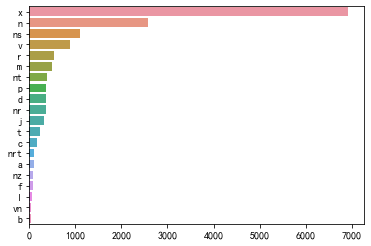

In [69]:
import jieba.posseg as pseg
#jieba.posseg.dt 为默认词性标注分词器
#句子分词后，标注每个词的词性
def ner (text) :
    flags=[]
    results = pseg.cut(text)
    for w in results:
        return [w.flag]
"""        if w.flag in ['n','nr','ns','nt','nz']:
            flags.append(w.flag)
        return flags
"""

from collections import Counter  
import seaborn as sns


ent=text["Chinese"].\
    apply( lambda x : ner(x))
ent=[x for sub in ent for x in sub]
 
counter=Counter(ent)

count=counter.most_common(20)
x,y=map(list,zip(*count))
sns.barplot(x=y,y=x)

### 词性编码	词性名称	注解

    a	形成词	取英语形容词 adjective的第1个字母。
    b	区别词	取汉字“别”的声母。
    c	连词	取英语连词 conjunction的第1个字母。
    d	副词	取 adverb的第2个字母，因其第1个字母已用于形容词。
    f	方位词	取汉字“方”
    g	语素	绝大多数语素都能作为合成词的“词根”，取汉字“根”的声母。
    j	简称略语	取汉字“简”的声母。
    l	习用语	习用语尚未成为成语，有点“临时性”，取“临”的声母。
    m	数词	取英语 numeral的第3个字母，n，u已有他用。
    n	名词	取英语名词 noun的第1个字母。
    nr	人名	名词代码 n和“人(ren)”的声母并在一起。
    ns	地名	名词代码 n和处所词代码s并在一起。
    nt	机构团体	“团”的声母为 t，名词代码n和t并在一起。
    nz	其他专名	“专”的声母的第 1个字母为z，名词代码n和z并在一起。
    o	拟声词	取英语拟声词 onomatopoeia的第1个字母。
    p	介词	取英语介词 prepositional的第1个字母。
    q	量词	取英语 quantity的第1个字母。
    r	代词	取英语代词 pronoun的第2个字母,因p已用于介词。
    s	处所词	取英语 space的第1个字母。
    tg	时语素	时间词性语素。时间词代码为 t,在语素的代码g前面置以T。
    t	时间词	取英语 time的第1个字母。
    u	助词	取英语助词 auxiliary
    vg	动语素	动词性语素。动词代码为 v。在语素的代码g前面置以V。
    v	动词	取英语动词 verb的第一个字母
    vd	副动词	直接作状语的动词。动词和副词的代码并在一起。
    vn	名动词	指具有名词功能的动词。动词和名词的代码并在一起。
    x	非语素字	非语素字只是一个符号，字母 x通常用于代表未知数、符号。
    z	状态词	取汉字“状”的声母的前一个字母
    un	未知词	不可识别词及用户自定义词组。取英文Unkonwn首两个字母。(非北大标准，CSW分词中定义)


/Users/patricia/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

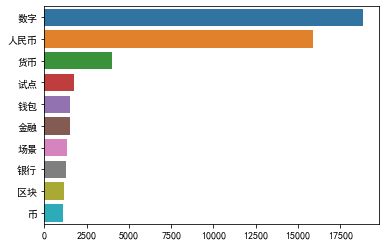

In [70]:
#可视化"n"名词实体最常见的令牌
def ner (text,ent= "n" ) :
    results = pseg.cut(text)
    return [w.word for w in results if w.flag==ent]
    
 
noun=text["Chinese"].apply( lambda x: ner(x))
nouns=[i for x in noun for i in x]
counter=Counter(nouns)
 
x,y=map(list,zip(*counter.most_common( 10 )))
sns.barplot(y,x)

/Users/patricia/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

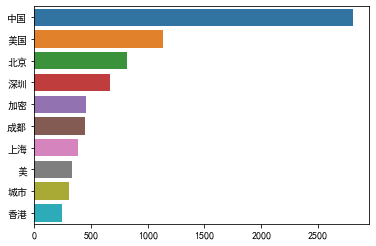

In [71]:
#可视化"ns"地名实体最常见的令牌
noun=text["Chinese"].apply( lambda x: ner(x,ent="ns"))
nouns=[i for x in noun for i in x]
counter=Counter(nouns)
 
x,y=map(list,zip(*counter.most_common( 10 )))
sns.barplot(y,x)

/Users/patricia/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

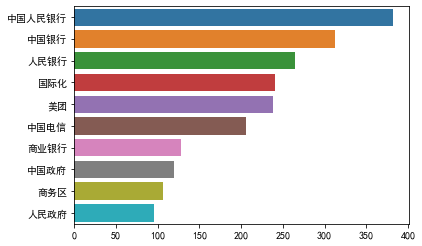

In [72]:
#可视化"nt"机构团体实体最常见的令牌
noun=text["Chinese"].apply( lambda x: ner(x,ent="nt"))
nouns=[i for x in noun for i in x]
counter=Counter(nouns)
 
x,y=map(list,zip(*counter.most_common( 10 )))
sns.barplot(y,x)

/Users/patricia/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

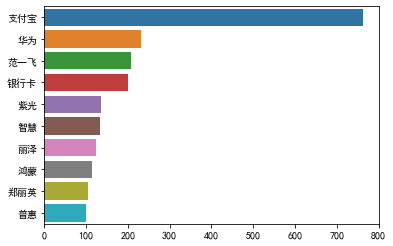

In [73]:
#可视化"nr"人名实体最常见的令牌
noun=text["Chinese"].apply( lambda x: ner(x,ent="nr"))
nouns=[i for x in noun for i in x]
counter=Counter(nouns)
 
x,y=map(list,zip(*counter.most_common( 10 )))
sns.barplot(y,x)

/Users/patricia/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

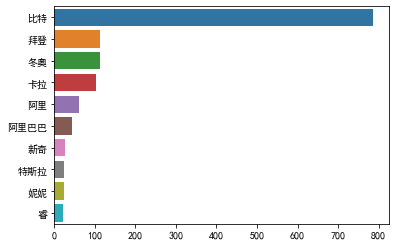

In [74]:
#可视化"nrt"实体最常见的令牌
noun=text["Chinese"].apply( lambda x: ner(x,ent="nrt"))
nouns=[i for x in noun for i in x]
counter=Counter(nouns)
 
x,y=map(list,zip(*counter.most_common( 10 )))
sns.barplot(y,x)

/Users/patricia/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

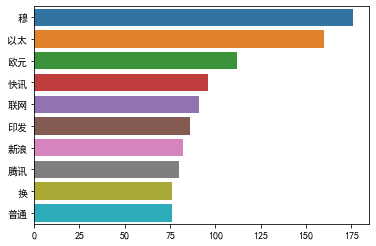

In [75]:
#可视化"nz"实体最常见的令牌
noun=text["Chinese"].apply( lambda x: ner(x,ent="nz"))
nouns=[i for x in noun for i in x]
counter=Counter(nouns)
 
x,y=map(list,zip(*counter.most_common( 10 )))
sns.barplot(y,x)

## 英文帖文词频统计

In [76]:
data_eng = []
with open("/Users/patricia/Downloads/WnT-20210929/cnt/帖文/Eng.txt", 'r') as f:
    for line in f:
        data_eng.append(line.strip())
data_eng=pd.DataFrame(data_eng,columns=["English"])

data_eng[:20]

,English
0,Shanghai Man: Economist says El Salvador 'on r...
1,The feature comes months after a small-scale t...
2,Shanghai Man: Economist says El Salvador 'on r...
3,Shanghai Man: Economist says El Salvador 'on r...
4,Shanghai Man: Economist says El Salvador ‘on r...
5,Shanghai Man: Economist says El Salvador 'on r...
6,Shanghai Man: Economist says El Salvador 'on r...
7,Digital renminbi (e-CNY) can be now withdrawn ...
8,New post (Economist says El Salvador 'on road ...
9,China reveals e-CNY wallet specifications http...


**使用TweetTokenizer对推特帖文分词**

In [77]:
from nltk.tokenize import TweetTokenizer
tweet_tokenizer = TweetTokenizer() 
data_eng["English"]=data_eng["English"].apply(lambda x : tweet_tokenizer.tokenize(x))
data_eng["English"]

0       [Shanghai, Man, :, Economist, says, El, Salvad...
1       [The, feature, comes, months, after, a, small-...
2       [Shanghai, Man, :, Economist, says, El, Salvad...
3       [Shanghai, Man, :, Economist, says, El, Salvad...
4       [Shanghai, Man, :, Economist, says, El, Salvad...
                              ...                        
4775    [Digital, Yuan, Launch, Draws, Near, :, https:...
4776    [Digital, Yuan, Launch, Draws, Near, :, https:...
4777    [https://t.co/u2QtP3oBwr, Employees, Paid, in,...
4778    [Digital, Yuan, launch, steps, :, https://t.co...
4779                                                  [*]
Name: English, Length: 4780, dtype: object

In [78]:
import re
import string
def remove_url(text):
    url = re.compile(r'https?://\S+|www\.\S+')
    return url.sub(r'',text)

def remove_punct(text):
    table = str.maketrans('', '', string.punctuation)
    return text.translate(table)
def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)

def remove_emoji(text):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)
def decontraction(text):
    text = re.sub(r"won\'t", " will not", text)
    text = re.sub(r"won\'t've", " will not have", text)
    text = re.sub(r"can\'t", " can not", text)
    text = re.sub(r"don\'t", " do not", text)
    
    text = re.sub(r"can\'t've", " can not have", text)
    text = re.sub(r"ma\'am", " madam", text)
    text = re.sub(r"let\'s", " let us", text)
    text = re.sub(r"ain\'t", " am not", text)
    text = re.sub(r"shan\'t", " shall not", text)
    text = re.sub(r"sha\n't", " shall not", text)
    text = re.sub(r"o\'clock", " of the clock", text)
    text = re.sub(r"y\'all", " you all", text)

    text = re.sub(r"n\'t", " not", text)
    text = re.sub(r"n\'t've", " not have", text)
    text = re.sub(r"\'re", " are", text)
    text = re.sub(r"\'s", " is", text)
    text = re.sub(r"\'d", " would", text)
    text = re.sub(r"\'d've", " would have", text)
    text = re.sub(r"\'ll", " will", text)
    text = re.sub(r"\'ll've", " will have", text)
    text = re.sub(r"\'t", " not", text)
    text = re.sub(r"\'ve", " have", text)
    text = re.sub(r"\'m", " am", text)
    text = re.sub(r"\'re", " are", text)
    return text 

def seperate_alphanumeric(text):
    words = text
    words = re.findall(r"[^\W\d_]+|\d+", words)
    return " ".join(words)

def clean_text(text):
    '''Make text lowercase, 
    remove text in square brackets,
    remove links,
    remove punctuation
    and remove words containing numbers.'''
    text = str(text).lower()
    text = re.sub('\[.*?\]', ' ', text)
    text = re.sub('https?://\S+|www\.\S+', ' ', text)
    text = re.sub('<.*?>+', ' ', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', ' ', text)
    text = re.sub('\w*\d\w*', ' ', text)
    text = re.sub('\'',' ', text)
    text = re.sub(r'\W+', ' ', text)
    text = re.sub(r'\b\w{1,2}\b', " ", text)# removes remaining one-letter words and two letters words 
    return text 

data_eng["English"] = data_eng["English"].apply(lambda x : remove_url(str(x)))
data_eng["English"] = data_eng["English"].apply(lambda x : remove_punct(str(x)))
data_eng["English"] = data_eng["English"].apply(lambda x : remove_emoji(str(x)))
data_eng["English"] = data_eng["English"].apply(lambda x : decontraction(str(x)))
data_eng["English"] = data_eng["English"].apply(lambda x : seperate_alphanumeric(str(x)))
data_eng["English"] = data_eng["English"].apply(lambda x : clean_text(str(x)))
data_eng["English"].head(20)

0     shanghai man economist says   salvador   road ...
1     the feature comes months after   smallscale te...
2     shanghai man economist says   salvador   road ...
3     shanghai man economist says   salvador   road ...
4     shanghai man economist says   salvador   road ...
5     shanghai man economist says   salvador   road ...
6     shanghai man economist says   salvador   road ...
7     digital renminbi ecny can   now withdrawn   at...
8     new post economist says   salvador   road   de...
9              china reveals ecny wallet specifications
10    zhejiang ecommerce bank   ltd has become the s...
11             china reveals ecny wallet specifications
12    china   central bank has unveiled specificatio...
13    digitalfriendly services products booming   ch...
14    digitalfriendly services products booming   ch...
15    crypto panic digitalfriendly services products...
16    digitalyuan debuts   futures transaction ecny ...
17    subscriberwrites china   digital currency 

In [79]:
from nltk.corpus import stopwords
stopwords_list= stopwords.words('english')
def remove_stop_words(text, stopwords=set(stopwords.words('english'))):
    """ This function removes stop words from a text
        inputs:
         - stopword list
         - text """

    # prepare new text
    text_splitted = "".join(text).split(" ")
    text_new = list()
    
    # stop words updated
    # stopwords = stopwords.union({"amp", "grocery store", "covid", "supermarket", "people", "grocery", "store", "price", "time"})
    
    # loop
    for word in text_splitted:
        if word not in stopwords:
            text_new.append(word)
    return " ".join(text_new)

def clean_stopwords(df, label):
    """ This function removes stopwords """
    df[label] = df[label].apply(lambda x: remove_stop_words(x))
    return df

data_eng["English"] = data_eng["English"].apply(lambda x: re.sub(r'\b\w{1,2}\b', " ", x))
data_eng["English"] = data_eng["English"].apply(lambda x: re.sub(r"[ \t]{2,}", " ", x))
dt=data_eng.copy()# no stopwords removal,lemmilization for sentimental analysis
df = clean_stopwords(data_eng,"English" )
df.head(20)

,English
0,shanghai man economist says salvador road deat...
1,feature comes months smallscale test beijing y...
2,shanghai man economist says salvador road deat...
3,shanghai man economist says salvador road deat...
4,shanghai man economist says salvador road deat...
5,shanghai man economist says salvador road deat...
6,shanghai man economist says salvador road deat...
7,digital renminbi ecny withdrawn atm beijing ec...
8,new post economist says salvador road death sa...
9,china reveals ecny wallet specifications


In [80]:
from nltk.stem.wordnet import WordNetLemmatizer
def lemmatize_one_text(text):
    """ This function lemmatizes words in text (it changes word to most close root word)
        inputs:
         - lemmatizer
         - text """
    # initialize lemmatizer
    lemmatizer = WordNetLemmatizer()
    # tags
    lem_tags = ['a', 'r', 'n', 'v']
    # prepare new text
    text_splitted = text.split(" ")
    text_new = list()
    # change bool
    changed = ''
    # loop
    for word in text_splitted:
        #text_new.append(lemmatizer.lemmatize(word))
        changed = ''
        for tag in lem_tags:
            if lemmatizer.lemmatize(word, tag) != word:
                changed = tag
        if changed == '':
            text_new.append(word)
        else:
            text_new.append(lemmatizer.lemmatize(word, changed))

    return " ".join(text_new)

def lemmatize(df, label):
    """ This function lemmatizes texts """
    df[label] = df[label].apply(lambda x: lemmatize_one_text(x))
    return df

df = lemmatize(df,"English" )
df.head()

,English
0,shanghai man economist say salvador road death...
1,feature come month smallscale test beijing yet...
2,shanghai man economist say salvador road death...
3,shanghai man economist say salvador road death...
4,shanghai man economist say salvador road death...


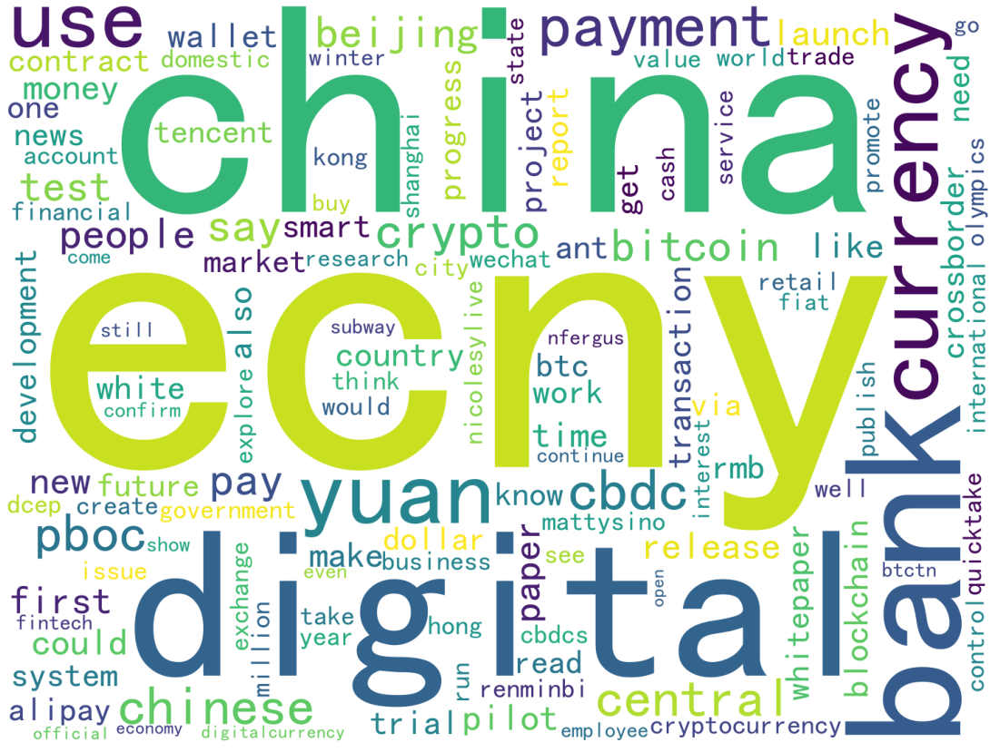

In [81]:
my_wordcloud = WordCloud(  
    background_color='white',  #设置背景颜色
    max_words=125,  #设置最大实现的字数
    font_path=r'/Users/patricia/Downloads/SimHei.ttf',  #设置字体格式，如不设置显示不了中文
    width=1440,
    height=1080,
    stopwords = stopwords
).generate_from_frequencies(Counter(" ".join(df["English"]).split(" ")))
plt.figure(figsize=(20,15))
plt.imshow(my_wordcloud)
plt.axis('off')
plt.show() 

## 英文帖文情感分析
### Sentiment Analysis through VADER

`VADER`在发现负面情绪方面表现更好,适合应用于社交媒体文本情感分析

返回一个字典，给出肯定pos，否定neg和中立neu的可能性，可以过滤筛选出可能性最高的情感。

In [82]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer #pip install vaderSentiment
def compute_vader_scores(df, label):
    sid = SentimentIntensityAnalyzer()
    df["vader_neg"] = df[label].apply(lambda x: sid.polarity_scores(x)["neg"])
    df["vader_neu"] = df[label].apply(lambda x: sid.polarity_scores(x)["neu"])
    df["vader_pos"] = df[label].apply(lambda x: sid.polarity_scores(x)["pos"])
    df["vader_comp"] = df[label].apply(lambda x: sid.polarity_scores(x)["compound"])
    return df
dt = compute_vader_scores(dt, "English")
dt['comp_score'] = dt['vader_comp'].apply(lambda c: 'pos' if c >0 else('neu' if c==0 else 'neg'))
dt.head()

,English,vader_neg,vader_neu,vader_pos,vader_comp,comp_score
0,shanghai man economist says salvador road deat...,0.140,0.860,0.0,-0.5994,neg
1,the feature comes months after smallscale test...,0.000,1.000,0.0,0.0000,neu
2,shanghai man economist says salvador road deat...,0.218,0.782,0.0,-0.5994,neg
3,shanghai man economist says salvador road deat...,0.109,0.891,0.0,-0.5994,neg
4,shanghai man economist says salvador road deat...,0.115,0.885,0.0,-0.5994,neg


In [83]:
percent_pos = round(100*dt[dt['comp_score']=="pos"].shape[0]/dt['comp_score'].shape[0], 2)
percent_neu = round(100*dt[dt['comp_score']=="neu"].shape[0]/dt['comp_score'].shape[0], 2)
percent_neg = round(100*dt[dt['comp_score']=="neg"].shape[0]/dt['comp_score'].shape[0], 2)

print(str(percent_pos) + "% of tweets have positive sentiment given by VADER")
print(str(percent_neg) + "% of tweets have negative sentiment given by VADER")

48.87% of tweets have positive sentiment given by VADER
16.32% of tweets have negative sentiment given by VADER


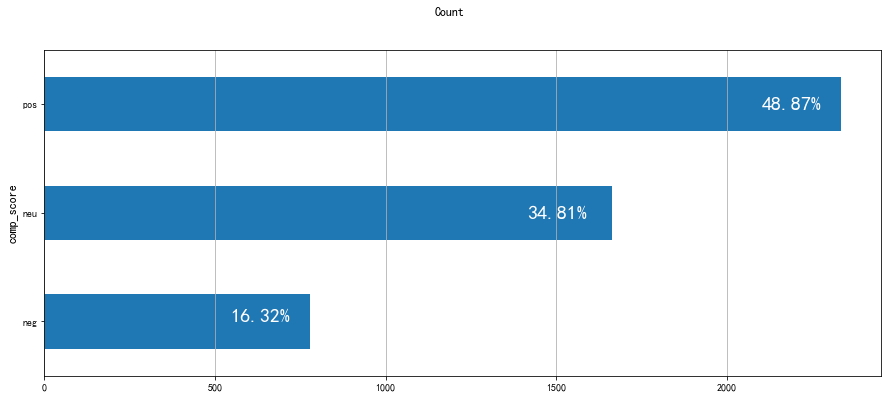

In [84]:
fig, ax = plt.subplots()
fig.set_size_inches(15, 6)
fig.suptitle("Count", fontsize=12)
dt.groupby("comp_score").count()[["English"]].rename(columns={"English": "count"}).plot(kind="barh", legend=False, 
        ax=ax).grid(axis='x')
plt.text(dt["comp_score"].value_counts()[0]*(1-0.1), 1.95, str(percent_pos)+"%", fontdict={"fontsize": 20, "color": "white"})
plt.text(dt["comp_score"].value_counts()[1]*(1-0.15), 0.95, str(percent_neu)+"%", fontdict={"fontsize": 20, "color": "white"})
plt.text(dt["comp_score"].value_counts()[2]*(1-0.3), 0, str(percent_neg)+"%", fontdict={"fontsize": 20, "color": "white"})

plt.show()

In [85]:
dt

,English,vader_neg,vader_neu,vader_pos,vader_comp,comp_score
0,shanghai man economist says salvador road deat...,0.140,0.860,0.000,-0.5994,neg
1,the feature comes months after smallscale test...,0.000,1.000,0.000,0.0000,neu
2,shanghai man economist says salvador road deat...,0.218,0.782,0.000,-0.5994,neg
3,shanghai man economist says salvador road deat...,0.109,0.891,0.000,-0.5994,neg
4,shanghai man economist says salvador road deat...,0.115,0.885,0.000,-0.5994,neg
...,...,...,...,...,...,...
4775,digital yuan launch draws near employees paid ...,0.000,0.844,0.156,0.3400,pos
4776,digital yuan launch draws near employees paid ...,0.000,0.844,0.156,0.3400,pos
4777,employees paid ecny tencent ant mastercard eng...,0.000,0.806,0.194,0.3400,pos
4778,digital yuan launch steps employees paid with ...,0.000,1.000,0.000,0.0000,neu


In [86]:
#dt["English"]=dt["English"].apply(lambda x : tweet_tokenizer.tokenize(x))
negative_tweets_text = " ".join([text for text in dt[dt["comp_score"]=="neg"]["English"]]).split(' ')
positive_tweets_text = " ".join([text for text in dt[dt["comp_score"]=="pos"]["English"]]).split(' ')

In [87]:
positive_word=set([i for i in positive_tweets_text if i not in negative_tweets_text])
neutral_word=set([i for i in negative_tweets_text if i in positive_tweets_text])
negative_word=set([i for i in negative_tweets_text if i not in positive_tweets_text])
print("--------------------------------")
print("Number of words in positive tweets:",'\n',len(positive_tweets_text))
print("Number of positive words:",'\n',len(positive_word))
print("--------------------------------")
print("Number of neutral words:",'\n',len(neutral_word))
print("--------------------------------")
print("Number of words in negative tweets:",'\n',len(negative_tweets_text))
print("Number of negative words:",'\n',len(negative_word))
print("--------------------------------")


--------------------------------
Number of words in positive tweets: 
 53389
Number of positive words: 
 3436
--------------------------------
Number of neutral words: 
 1402
--------------------------------
Number of words in negative tweets: 
 17139
Number of negative words: 
 997
--------------------------------


In [88]:
from nltk.corpus import stopwords
stopwords= stopwords.words('english')

In [89]:
mapped_negative_text=[text for text in negative_tweets_text if text in negative_word]
mapped_positive_text=[text for text in positive_tweets_text if text in positive_word]
print("Number of mapped negative text:",len(mapped_negative_text))
print("Number of mapped positive text:",len(mapped_positive_text))

Number of mapped negative text: 2868
Number of mapped positive text: 13349


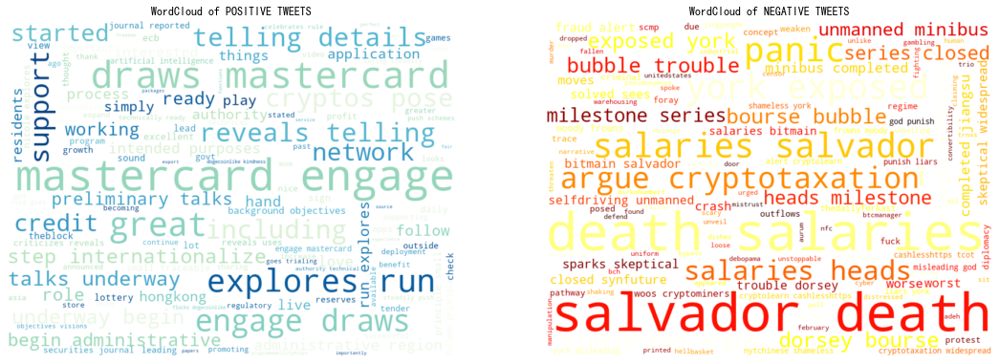

In [90]:
# 通过云图分别展示对应pos和neg的频繁出现单词
from wordcloud import WordCloud
cloud_negative_tweets = " ".join(mapped_negative_text)
wordcloud_negative = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white", colormap="hot",stopwords = stopwords).generate(cloud_negative_tweets)

cloud_positive_tweets = " ".join(mapped_positive_text)
wordcloud_positive = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white", colormap="GnBu_r",stopwords = stopwords).generate(cloud_positive_tweets)

parameters = {'axes.labelsize': 12,
              'axes.titlesize': 10}

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18.5, 7)
ax1.imshow(wordcloud_positive, interpolation='bilinear')
ax1.axis("off")
ax1.set_title("WordCloud of POSITIVE TWEETS", fontsize=12)
ax2.imshow(wordcloud_negative, interpolation='bilinear')
ax2.axis("off")
ax2.set_title("WordCloud of NEGATIVE TWEETS", fontsize=12)
plt.rcParams.update(parameters)
plt.show()

In [91]:
from nltk.corpus import stopwords
stopwords= stopwords.words('english')

In [92]:
def top20(textlist):
    # First make a string out of the entire list
    BIGstr = " ".join(textlist)
    wordlist = BIGstr.split(" ")
    wordlist=[i for i in wordlist if i not in stopwords]
    wordcount = Counter(wordlist) 
    del wordcount['']
    return(wordcount.most_common(20))

print(top20(mapped_negative_text))
temp = pd.DataFrame(top20(mapped_negative_text))
temp.columns = ['Negative_tweets_word','Count']
temp.style.background_gradient(cmap='OrRd')

[('salvador', 66), ('death', 64), ('salaries', 64), ('york', 30), ('panic', 18), ('exposed', 18), ('argue', 16), ('bitmain', 16), ('widespread', 14), ('cryptotaxation', 14), ('bubble', 14), ('heads', 12), ('dorsey', 12), ('bourse', 12), ('trouble', 12), ('milestone', 10), ('series', 10), ('closed', 10), ('fraud', 10), ('alert', 10)]


,Negative_tweets_word,Count
0,salvador,66
1,death,64
2,salaries,64
3,york,30
4,panic,18
5,exposed,18
6,argue,16
7,bitmain,16
8,widespread,14
9,cryptotaxation,14


In [93]:
print(top20(mapped_positive_text))
temp2 = pd.DataFrame(top20(mapped_positive_text))
temp2.columns = ['Positive_tweets_word','Count']
temp2.style.background_gradient(cmap='GnBu')

[('mastercard', 86), ('engage', 86), ('draws', 66), ('great', 63), ('run', 56), ('explores', 54), ('network', 44), ('reveals', 44), ('step', 44), ('support', 42), ('details', 38), ('including', 38), ('daily', 37), ('cryptos', 37), ('started', 36), ('ready', 34), ('pose', 32), ('shenzhen', 32), ('telling', 32), ('credit', 30)]


,Positive_tweets_word,Count
0,mastercard,86
1,engage,86
2,draws,66
3,great,63
4,run,56
5,explores,54
6,network,44
7,reveals,44
8,step,44
9,support,42


### 以整体帖文情感分类中，更细粒度化的情感分类
#### 整体帖文分类为正面的词典
#### 以vader分类词语情感和情绪

In [94]:
pos_dict=pd.DataFrame(mapped_positive_text,columns=["pos_dict"])
pos_dict = compute_vader_scores(pos_dict, "pos_dict")
pos_dict

,pos_dict,vader_neg,vader_neu,vader_pos,vader_comp
0,debuts,0.0,1.0,0.0,0.00
1,period,0.0,1.0,0.0,0.00
2,advent,0.0,1.0,0.0,0.00
3,posted,0.0,1.0,0.0,0.00
4,advent,0.0,1.0,0.0,0.00
...,...,...,...,...,...
13344,draws,0.0,1.0,0.0,0.00
13345,mastercard,0.0,1.0,0.0,0.00
13346,engage,0.0,0.0,1.0,0.34
13347,mastercard,0.0,1.0,0.0,0.00


In [95]:
pos_words=pos_dict[pos_dict["vader_pos"]>0]["pos_dict"]
neg_words=pos_dict[pos_dict["vader_neg"]>0]["pos_dict"]

pos_words_dict=[]
for i in pos_words:
    pos_words_dict.append(i)
    
neg_words_dict=[]
for i in neg_words:
    neg_words_dict.append(i)

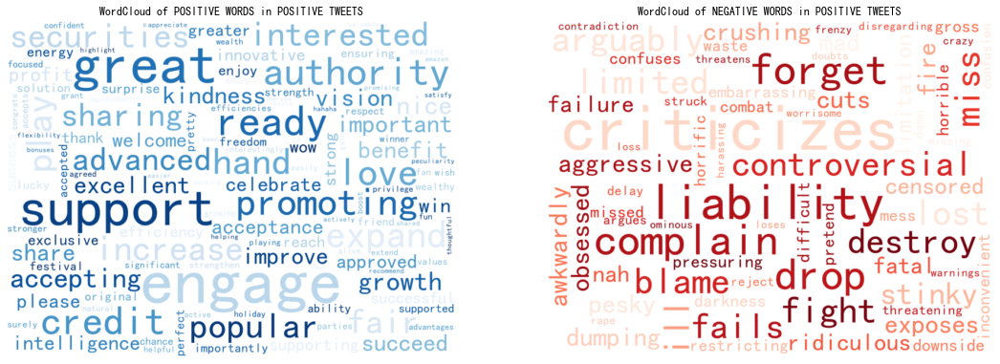

In [96]:
# 通过云图分别展示对应pos和neg的频繁出现单词

cloud_negative_twitter =  " ".join(neg_words_dict)
wordcloud_negative_twitter = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="Reds",stopwords = stopwords,collocations=False).generate(cloud_negative_twitter)

cloud_positive_twitter =  " ".join(pos_words_dict)
wordcloud_positive_twitter = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf',colormap="Blues",stopwords = stopwords,collocations=False).generate(cloud_positive_twitter)

parameters = {'axes.labelsize': 12,
              'axes.titlesize': 10}

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18.5, 7)
ax1.imshow(wordcloud_positive_twitter, interpolation='bilinear')
ax1.axis("off")
ax1.set_title("WordCloud of POSITIVE WORDS in POSITIVE TWEETS", fontsize=12)
ax2.imshow(wordcloud_negative_twitter, interpolation='bilinear')
ax2.axis("off")
ax2.set_title("WordCloud of NEGATIVE WORDS in POSITIVE TWEETS", fontsize=12)
plt.rcParams.update(parameters)
plt.show()

In [97]:
print(top20(pos_words_dict))
t = pd.DataFrame(top20(pos_words_dict))
t.columns = ['POS_WORDS_POS_TWEETS','Count']
t.style.background_gradient(cmap='Blues')

[('engage', 86), ('great', 63), ('support', 42), ('ready', 34), ('credit', 30), ('authority', 30), ('promoting', 28), ('love', 26), ('hand', 26), ('expand', 24), ('increase', 24), ('play', 24), ('popular', 23), ('interested', 22), ('securities', 22), ('fair', 22), ('sharing', 20), ('advanced', 20), ('accepting', 20), ('nice', 18)]


,POS_WORDS_POS_TWEETS,Count
0,engage,86
1,great,63
2,support,42
3,ready,34
4,credit,30
5,authority,30
6,promoting,28
7,love,26
8,hand,26
9,expand,24


In [98]:
print(top20(neg_words_dict))
t = pd.DataFrame(top20(neg_words_dict))
t.columns = ['NEG_WORDS_POS_TWEETS','Count']
t.style.background_gradient(cmap='Reds')

[('criticizes', 14), ('liability', 8), ('forget', 6), ('drop', 6), ('limited', 4), ('blame', 4), ('miss', 4), ('lost', 4), ('ill', 4), ('fight', 4), ('complain', 4), ('arguably', 4), ('controversial', 4), ('destroy', 4), ('fails', 4), ('stinky', 3), ('fire', 2), ('exposes', 2), ('mad', 2), ('awkwardly', 2)]


,NEG_WORDS_POS_TWEETS,Count
0,criticizes,14
1,liability,8
2,forget,6
3,drop,6
4,limited,4
5,blame,4
6,miss,4
7,lost,4
8,ill,4
9,fight,4


#### 整体帖文分类为负面的词典
#### 以Vader分类词语情感和情绪

In [99]:
neg_dict=pd.DataFrame(mapped_negative_text,columns=["neg_dict"])
neg_dict = compute_vader_scores(neg_dict, "neg_dict")
neg_dict

,neg_dict,vader_neg,vader_neu,vader_pos,vader_comp
0,salvador,0.0,1.0,0.0,0.0000
1,death,1.0,0.0,0.0,-0.5994
2,salaries,0.0,1.0,0.0,0.0000
3,bch,0.0,1.0,0.0,0.0000
4,discount,0.0,1.0,0.0,0.0000
...,...,...,...,...,...
2863,damaged,1.0,0.0,0.0,-0.4404
2864,corrects,0.0,1.0,0.0,0.0000
2865,reuters,0.0,1.0,0.0,0.0000
2866,realise,0.0,1.0,0.0,0.0000


In [100]:
pos_words=neg_dict[neg_dict["vader_pos"]>0]["neg_dict"]
neg_words=neg_dict[neg_dict["vader_neg"]>0]["neg_dict"]

pos_words_dict=[]
for i in pos_words:
    pos_words_dict.append(i)
    
neg_words_dict=[]
for i in neg_words:
    neg_words_dict.append(i)

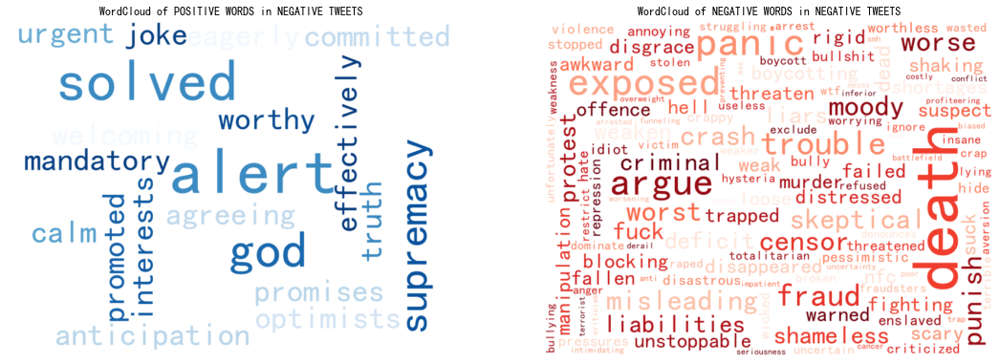

In [101]:
# 通过云图分别展示对应pos和neg的频繁出现单词

cloud_negative_twitter =  " ".join(neg_words_dict)
wordcloud_negative_twitter = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf', colormap="Reds",stopwords = stopwords,collocations=False).generate(cloud_negative_twitter)

cloud_positive_twitter =  " ".join(pos_words_dict)
wordcloud_positive_twitter = WordCloud(width=800, height=600, max_font_size=120,max_words=125, background_color="white",font_path=r'/Users/patricia/Downloads/SimHei.ttf',colormap="Blues",stopwords = stopwords,collocations=False).generate(cloud_positive_twitter)

parameters = {'axes.labelsize': 12,
              'axes.titlesize': 10}

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18.5, 7)
ax1.imshow(wordcloud_positive_twitter, interpolation='bilinear')
ax1.axis("off")
ax1.set_title("WordCloud of POSITIVE WORDS in NEGATIVE TWEETS", fontsize=12)
ax2.imshow(wordcloud_negative_twitter, interpolation='bilinear')
ax2.axis("off")
ax2.set_title("WordCloud of NEGATIVE WORDS in NEGATIVE TWEETS", fontsize=12)
plt.rcParams.update(parameters)
plt.show()

In [102]:
print(top20(pos_words_dict))
t = pd.DataFrame(top20(pos_words_dict))
t.columns = ['POS_WORDS_NEG_TWEETS','Count']
t.style.background_gradient(cmap='Blues')

[('alert', 10), ('solved', 8), ('god', 6), ('supremacy', 4), ('joke', 2), ('promises', 2), ('promoted', 2), ('worthy', 2), ('welcoming', 2), ('committed', 2), ('calm', 2), ('optimists', 2), ('effectively', 2), ('urgent', 2), ('anticipation', 2), ('agreeing', 2), ('truth', 2), ('mandatory', 2), ('interests', 2), ('eagerly', 2)]


,POS_WORDS_NEG_TWEETS,Count
0,alert,10
1,solved,8
2,god,6
3,supremacy,4
4,joke,2
5,promises,2
6,promoted,2
7,worthy,2
8,welcoming,2
9,committed,2


In [103]:
print(top20(neg_words_dict))
t = pd.DataFrame(top20(neg_words_dict))
t.columns = ['NEGATIVE WORDS by Vader in NEGATIVE WEIBO','Count']
t.style.background_gradient(cmap='Reds')

[('death', 64), ('panic', 18), ('exposed', 18), ('argue', 16), ('trouble', 12), ('fraud', 10), ('skeptical', 8), ('censor', 8), ('misleading', 8), ('punish', 8), ('crash', 8), ('worse', 8), ('worst', 8), ('moody', 8), ('shameless', 6), ('liars', 6), ('fuck', 6), ('weaken', 6), ('deficit', 6), ('liabilities', 6)]


,NEGATIVE WORDS by Vader in NEGATIVE WEIBO,Count
0,death,64
1,panic,18
2,exposed,18
3,argue,16
4,trouble,12
5,fraud,10
6,skeptical,8
7,censor,8
8,misleading,8
9,punish,8


### Sentiment Analysis through TextBlob


   **TextBlob**
   返回：   
    
    polarity 极性:[-1,1], 1表示肯定陈述, -1表示否定陈述

    subjectivity 主观性:[0,1], 指个人的意见和感受如何影响某人的判断力

In [113]:
# 探索极性与主观性关系
from textblob import TextBlob
def polarity_analysis(text):
    analysis = TextBlob(text)
    Polarity = analysis.sentiment[0]
    return Polarity
 
def subjectivity_analysis(text):
    analysis = TextBlob(text)
    Subjectivity = analysis.sentiment[1]
    return Subjectivity 

dt["Polarity"] = dt.English.map(lambda x:polarity_analysis(x) )
dt["Subjectivity"] = dt.English.map(lambda x:subjectivity_analysis(x) )

dt[["Polarity","Subjectivity"]].head()

,Polarity,Subjectivity
0,0.000000,0.000000
1,0.425000,0.525000
2,0.000000,0.000000
3,-0.001786,0.108929
4,-0.001786,0.108929


In [114]:
import plotly.express as px
fig=px.scatter(dt.sample(n=2000), x= "Polarity", y = "Subjectivity")
fig.update_xaxes(title_text='<---- Negative ----Polarity---- Positive ---->')
fig.update_yaxes(title_text='<--- Facts ------Subjectivity------ Opinions --->')
fig.show()

有主观性vs极性线性关系可观察到，当内容归类于观点Opinion，言论极性偏激；内容更客观更倾向于描述事实Fact，言论极性中立

### Entity Detection through Spacy
命名实体识别NER


In [104]:
import spacy
from spacy import displacy
nlp = spacy.load('en_core_web_sm')

<AxesSubplot:>

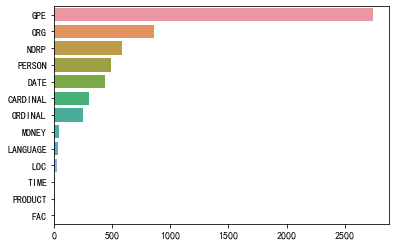

In [105]:
from collections import Counter  
import seaborn as sns
def ner (text) :
    doc=nlp(text)
    return [X.label_ for X in doc.ents]


ent=df["English"].\
    apply( lambda x : ner(x))
ent=[x for sub in ent for x in sub]
 
counter=Counter(ent)

count=counter.most_common()
x,y=map(list,zip(*count))
sns.barplot(x=y,y=x)

/Users/patricia/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

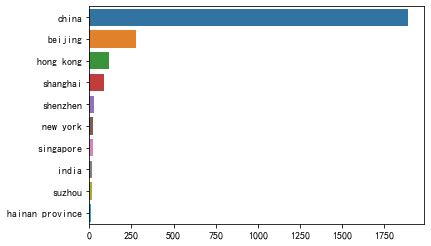

In [106]:
#可视化"GPE"实体最常见的令牌
def ner (text,ent= "GPE" ) :
    doc=nlp(text)
    return [X.text for X in doc.ents if X.label_ == ent]
 
gpe=df["English"].apply( lambda x: ner(x))
gpe=[i for x in gpe for i in x]
counter=Counter(gpe)
 
x,y=map(list,zip(*counter.most_common( 10 )))
sns.barplot(y,x)

In [107]:
place=counter.most_common( 25 )
place

[('china', 1894),
 ('beijing', 280),
 ('hong kong', 118),
 ('shanghai', 90),
 ('shenzhen', 30),
 ('new york', 24),
 ('singapore', 22),
 ('india', 18),
 ('suzhou', 14),
 ('hainan province', 10),
 ('xrp', 10),
 ('jiangsu', 10),
 ('japan', 10),
 ('russia', 10),
 ('taiwan', 10),
 ('olympicshttps', 8),
 ('america', 8),
 ('beijing suzhou', 8),
 ('malaysia', 8),
 ('nytchinese', 6),
 ('iran', 6),
 ('hainan', 6),
 ('fintechbalerina', 6),
 ('moneychina', 4),
 ('south korea', 4)]

/Users/patricia/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

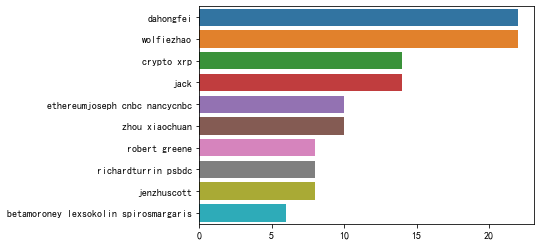

In [108]:
#可视化"PERSON"实体最常见的令牌
gpe=df["English"].apply( lambda x: ner(x,"PERSON"))
gpe=[i for x in gpe for i in x]
counter=Counter(gpe)
 
x,y=map(list,zip(*counter.most_common( 10 )))
sns.barplot(y,x)

In [109]:
person=counter.most_common( 25 )
person

[('dahongfei', 22),
 ('wolfiezhao', 22),
 ('crypto xrp', 14),
 ('jack', 14),
 ('ethereumjoseph cnbc nancycnbc', 10),
 ('zhou xiaochuan', 10),
 ('robert greene', 8),
 ('richardturrin psbdc', 8),
 ('jenzhuscott', 8),
 ('betamoroney lexsokolin spirosmargaris', 6),
 ('theblock wolfiezhao', 6),
 ('jamesplloyd', 6),
 ('richardturrin eyuan', 4),
 ('thel', 4),
 ('newsofbsc', 4),
 ('michael heydave', 4),
 ('nhaguma carmellecadet', 4),
 ('xiongan', 4),
 ('hamilton', 4),
 ('optimalwin vtany', 4),
 ('btctn officialprodax', 4),
 ('mirkohumbert weiweidai', 4),
 ('mattysino sallywang', 4),
 ('rijingzhongwen china', 4),
 ('jasuja richardturrin cgledhill', 4)]

/Users/patricia/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

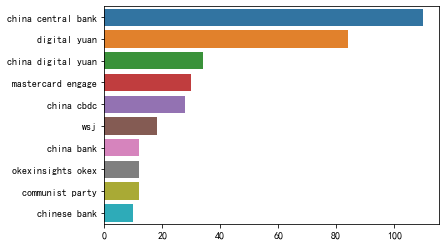

In [110]:
#可视化"ORG"实体最常见的令牌
gpe=df["English"].apply( lambda x: ner(x,"ORG"))
gpe=[i for x in gpe for i in x]
counter=Counter(gpe)
 
x,y=map(list,zip(*counter.most_common( 10 )))
sns.barplot(y,x)

In [111]:
org=counter.most_common( 25 )
org       

[('china central bank', 110),
 ('digital yuan', 84),
 ('china digital yuan', 34),
 ('mastercard engage', 30),
 ('china cbdc', 28),
 ('wsj', 18),
 ('china bank', 12),
 ('okexinsights okex', 12),
 ('communist party', 12),
 ('chinese bank', 10),
 ('cnbc', 10),
 ('digitalyuan digital yuan', 8),
 ('central bank', 8),
 ('chinese yuan', 8),
 ('okexinsights okex xbt xmugen', 8),
 ('ecny facilitate renminbi internationalization', 8),
 ('knownews ambcrypto', 6),
 ('dalian commodity exchange', 6),
 ('diverge china', 6),
 ('ama', 6),
 ('crypto news', 6),
 ('cbs', 6),
 ('crypto digital yuan', 6),
 ('pboc digital currency institute hkma', 6),
 ('ccp', 6)]

In [112]:
pd.DataFrame(place,columns=["words","count"]).to_csv('/Users/patricia/Downloads/place_eng.csv')
pd.DataFrame(org,columns=["words","count"]).to_csv('/Users/patricia/Downloads/org_eng.csv')
pd.DataFrame(person,columns=["words","count"]).to_csv('/Users/patricia/Downloads/person_eng.csv')
